# Animal detection

#### ``Dataset``

The data for this model was obtained from Kaggle: https://www.kaggle.com/datasets/alessiocorrado99/animals10

The dataset will be used to classify different animals falling within the following classifications:
- dog 
- horse
- elephant
- butterfly 
- chicken
- cat 
- cow
- sheep
- spider
- squirrel

*** NOTE: DATASET is one directory above this file 

In [1]:
# imports 
import pandas as pd
import numpy as np
import random
import os

import cv2
from processing_functions import *

import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import Image

In [2]:
# dictionary obtained along with dataset to identify labels in english from italian
translate = {"cane": "dog", "cavallo": "horse", "elefante": "elephant", "farfalla": "butterfly",
             "gallina": "chicken", "gatto": "cat", "mucca": "cow", "pecora": "sheep", "ragno" : "spider", "scoiattolo": "squirrel"}


In [3]:
# paths to each class of images - the images folder is one directory above this file 
dog_path = '../archive/raw-img/cane/'
horse_path = '../archive/raw-img/cavallo/'
elephant_path = '../archive/raw-img/elefante/'
butterfly_path = '../archive/raw-img/farfalla/'
chicken_path = '../archive/raw-img/gallina/'
cat_path = '../archive/raw-img/gatto/'
cow_path = '../archive/raw-img/mucca/'
sheep_path = '../archive/raw-img/pecora/'
spider_path = '../archive/raw-img/ragno/'
squirrel_path = '../archive/raw-img/scoiattolo/'

In [4]:
# assigning label for each class
dog_labels = np.zeros(len(os.listdir(dog_path))) 
horse_labels = np.ones(len(os.listdir(horse_path)))
elephant_labels = 2 * np.ones(len(os.listdir(elephant_path)))
butterfly_labels = 3 * np.ones(len(os.listdir(butterfly_path)))
chicken_labels = 4 * np.ones(len(os.listdir(chicken_path)))
cat_labels = 5 * np.ones(len(os.listdir(cat_path)))
cow_labels = 6 * np.ones(len(os.listdir(cow_path)))
sheep_labels = 7 * np.ones(len(os.listdir(sheep_path)))
spider_labels = 8 * np.ones(len(os.listdir(spider_path)))
squirrel_labels = 9 * np.ones(len(os.listdir(squirrel_path)))

In [5]:
print('dog labels shape: ', dog_labels.shape)
print('horse labels shape: ', horse_labels.shape)
print('elephant labels shape: ', elephant_labels.shape)
print('butterfly labels shape: ', butterfly_labels.shape)
print('chicken labels shape: ', chicken_labels.shape)
print('cat labels shape: ', cat_labels.shape)
print('cow labels shape: ', cow_labels.shape)
print('sheep labels shape: ', sheep_labels.shape)
print('spider labels shape: ', spider_labels.shape)
print('squirrel labels shape: ', squirrel_labels.shape)

dog labels shape:  (4863,)
horse labels shape:  (2623,)
elephant labels shape:  (1446,)
butterfly labels shape:  (2112,)
chicken labels shape:  (3098,)
cat labels shape:  (1668,)
cow labels shape:  (1866,)
sheep labels shape:  (1820,)
spider labels shape:  (4821,)
squirrel labels shape:  (1862,)


#### ``EDA``

Sample of dog images:


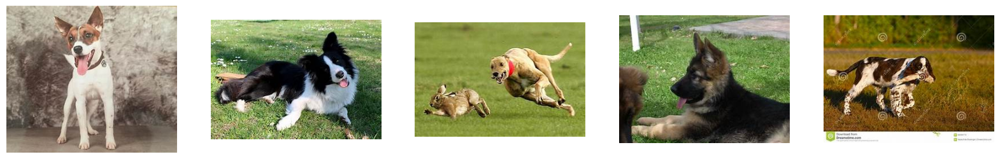

Sample of horse images:


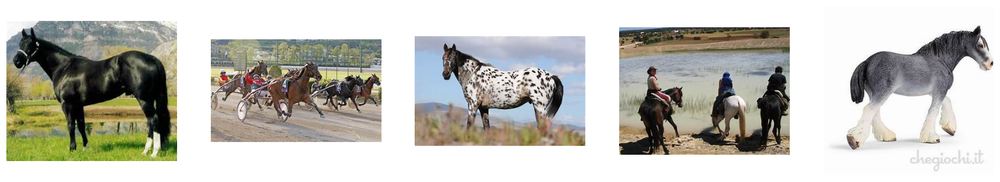

Sample of elephant images:


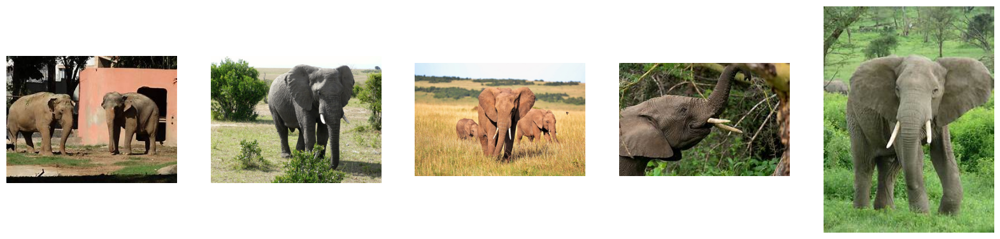

Sample of butterfly images:


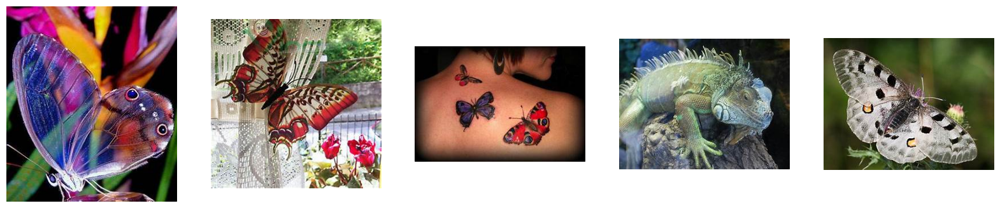

Sample of chicken images:


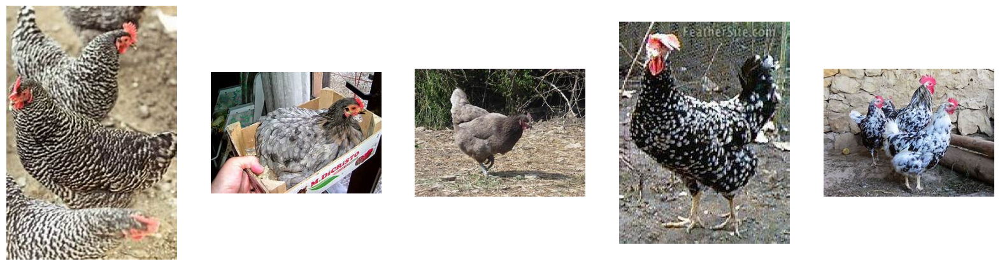

Sample of cat images:


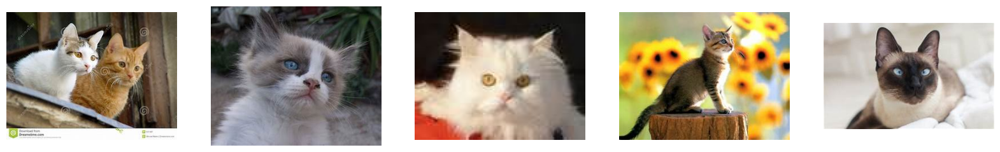

Sample of cow images:


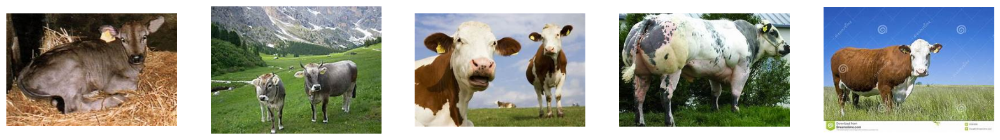

Sample of sheep images:


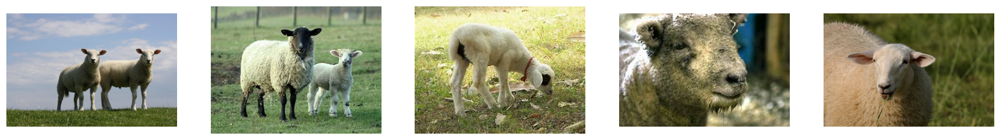

Sample of spider images:


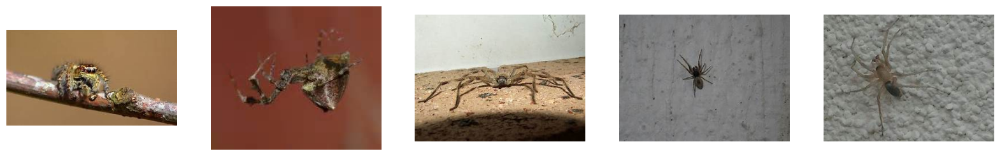

Sample of squirrel images:


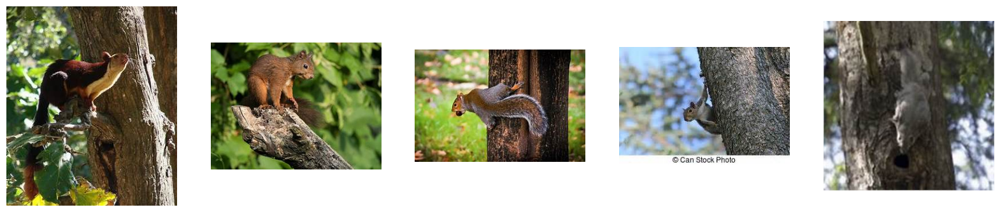

In [6]:
random.seed(12345)

dog_list = []
dog_images = []
for file in os.listdir(dog_path):
    dog_list.append(dog_path+file)   

random.shuffle(dog_list)

print('Sample of dog images:')

# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(dog_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()


horse_list = []
for file in os.listdir(horse_path):
    horse_list.append(horse_path+file)   

random.shuffle(horse_list)

print('Sample of horse images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(horse_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()

elephant_list = []
for file in os.listdir(elephant_path):
    elephant_list.append(elephant_path+file)   

random.shuffle(elephant_list)

print('Sample of elephant images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(elephant_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()


butterfly_list = []
for file in os.listdir(butterfly_path):
    butterfly_list.append(butterfly_path+file)   

random.shuffle(butterfly_list)

print('Sample of butterfly images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(butterfly_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()



chicken_list = []
for file in os.listdir(chicken_path):
    chicken_list.append(chicken_path+file)   

random.shuffle(chicken_list)

print('Sample of chicken images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(chicken_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()



cat_list = []
for file in os.listdir(cat_path):
    cat_list.append(cat_path+file)   

random.shuffle(cat_list)

print('Sample of cat images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(cat_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()



cow_list = []
for file in os.listdir(cow_path):
    cow_list.append(cow_path+file)   

random.shuffle(cow_list)

print('Sample of cow images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(cow_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()


sheep_list = []
for file in os.listdir(sheep_path):
    sheep_list.append(sheep_path+file)   

random.shuffle(sheep_list)

print('Sample of sheep images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(sheep_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()


spider_list = []
for file in os.listdir(spider_path):
    spider_list.append(spider_path+file)   

random.shuffle(spider_list)

print('Sample of spider images:')
    
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(spider_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()


squirrel_list = []
for file in os.listdir(squirrel_path):
    squirrel_list.append(squirrel_path+file)   

random.shuffle(squirrel_list)

print('Sample of squirrel images:')
# display first 5 images
fig, axs = plt.subplots(1, 5, figsize=(20, 10))
for i in range(5):
    img = cv2.imread(squirrel_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # OpenCV loads images in BGR, convert to RGB
    axs[i].imshow(img)
    axs[i].axis('off')  # Turn off axis labels for cleaner display
plt.show()

The sample of images highlight a few things about the images:
- they are not of the same scale 
- quality of image itself varies
- the posiitioning of the animals vary
- some images only provide a partial view of the animal in question 
- some images contain multiple animals in the frame 
- some images contain noise in the form of text or logos

Manual inspection of images has shown instances of completely incorrect image or images containing multiple labels but only classified as one. These images will be removed.

In order to prevent file size from exceeding, the code to diplay the mislabelled images is commented out.

In [7]:
# in dog data
mislabelled_dog = ['OIP-_fFULVvrJ1pzZ5opnNfLMAHaFo.jpeg', 'OIP--6UY_QQC69uZF4CrwEcfUQHaHa.jpeg',
                    'OIP--LSF87v0ehcSg4hzc4Qy7QHaE8.jpeg', 'OIP--pLfP_C-rvesSFF1tplovAAAAA.jpeg',
                   'OIP-4kZIQyUBxO8KuG-xRkuoTAHaG6.jpeg', 'OIP-b2tK4DF9PKHOVd5Pnf5kXQHaEK.jpeg',
                   'OIP-BC-Gd_ec2ygynxqNr1En2wEsDh.jpeg', 'OIP-Cp3JXmduUHWUNkwGo8r-KgHaH5.jpeg',
                   'OIP-cfXsPxcuLXy9nw6BpUdNPwHaHa.jpeg', 'OIP-YOD9YX07m7dz3gxH33dcZAHaFj.jpeg', 
                   'OIP-XIxzwE9ixKLSxbKEE4AJEwHaE2.jpeg', 'OIP-Wqc5z9ur06JKxqLNFpA-NwHaF7.jpeg',
                   'OIP-wHe99Iau9yrJ-WPlliiV0AHaD2.jpeg', 'OIP-VjQi1a47v34Mo0rbUnTpdgHaE8.jpeg',
                   'OIP-vdxnRL7ez7R9ntTQ7SRqKwHaJ2.jpeg', 'OIP-TfCQtpNeEukFR16YKKEciwHaHu.jpeg', 
                   'OIP-t3_EnR3Wvqeh8BdEaRTuvgHaE8.jpeg', 'OIP-ShCEQzt9oEHTNNFtq1vrmwHaLH.jpeg',
                   'OIP-sCJhZq2MqYnlSDIBDBIuzgHaFj.jpeg', 'OIP-rLJhzJYBLlZgSPpRoBt_WwHaFj.jpeg',
                   'OIP-QXa3PKqKWFeHbW5raOEgEwHaFj.jpeg', 'OIP-QuEL2vwXnDn0-AMA0sHwPwHaD0.jpeg',
                   'OIP-QQslxfA4d9wB4TFzs3iimAHaD4.jpeg', 'OIP-oXYQrd39_m6wM-cXtAFI4AHaEn.jpeg',
                   'OIP-oc_3GsdwStg6HPIeBi15lQHaFj.jpeg', 'OIP-lwIyWubwpiLRqzdbPUhdCgHaE7.jpeg',
                   'OIP-L5TNaPEq7eYUVK9E0W69ZAHaE7.jpeg', 'OIP-KTnWtlh_K4CpJNb4kI9SwgHaFQ.jpeg',
                   'OIP-jQ0htJXbE7MeAo52_JVm4AHaEo.jpeg', 'OIP-HLTrBuzp0NC9C9X1NDw9JQHaFU.jpeg',
                   'OIP-HIlaivdYpYuGwu6iH0HgdwHaCx.jpeg', 'OIP-fsRkcuxWj8Enfyis5Y-pbQHaEK.jpeg',
                   'OIP-EsgVa5hhBk8nSBhXsrNdVwHaFJ.jpeg', 'OIP-DzVLTnFEyhcAHrWg76hvbAHaE7.jpeg' ]

  
mislabelled_dog_images = []
for img in mislabelled_dog:
    mislabelled_dog_images.append(dog_path+img)
    
# print('Mislabelled dog images:')
# rows, cols = 9, 4
# fig, axs = plt.subplots(rows, cols, figsize=(30, 30))

# for ax, img_path in zip(axs.flatten(), mislabelled_dog_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()

In [8]:
# in horse data
mislabelled_horse = ['OIP--1iQSsCUgn4E10K_tST_QwHaHa.jpeg', 'OIP-ASJRIuCjXSElfG6KAMW-iwHaNJ.jpeg',
                      'OIP-FfLuf_Rks38Izdmz7OgrjQHaFj.jpeg', 'OIP-FoNdAojghcfpAzV69qhWUgHaE5.jpeg',
                      'OIP-GSfH8Gq7dpprmJZRGISUNgHaFc.jpeg', 'OIP-hB9VSWaxLEHX8PrQ6HD0SAHaEK.jpeg',
                      'OIP-Kkd4YNrvpU2X7oZoSTrmsgHaE8.jpeg', 'OIP-NOvVgB7yT4Wn-ZSKgXLRaAHaFT.jpeg',
                      'OIP-OOoZpolofoX_JO3Y4prNjQHaEK.jpeg', 'OIP-Pcr4UUzMoYYs9nm5gZpGwAHaJ4.jpeg',
                      'OIP-XMXUZo5E9hmbc_kWc9GtrgHaFj.jpeg', 'OIP-XOFHmo_qcKEAUgqQxESs5AHaE7.jpeg',
                      'OIP-yXhdfSY05RCYJMGBAqvBAwHaEL.jpeg', 'OIP-zBSqT-UWx5oyLq3pUjOPsQHaFj.jpeg',
                      'OIP-zbUXSJNmOibSFjyz7u4OOQHaEK.jpeg', 'OIP-ZZhCD9PI4oWKdy_eaRjE7QHaFb.jpeg']



mislabelled_horse_images = []
for img in mislabelled_horse:
    mislabelled_horse_images.append(horse_path+img)
    

# print('Mislabelled horse images:')
# nrows, ncols = 4, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30, 30))
# for ax, img_path in zip(axs.flatten(), mislabelled_horse_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()

In [9]:
mislabelled_elephant = ['e837b90a29fd083ed1584d05fb1d4e9fe777ead218ac104497f5c978a4eebdbd_640.jpg', 'OIP-3k_ZBVOd3Ozz6vh1fVHFGAHaEK.jpeg',
                         'OIP-9StAGjbop--m-uwM9wFh9QHaFZ.jpeg', 'OIP-29few3seDZRZMOTEhpOAAQHaE8.jpeg', 
                         'OIP-75pmfkEuZ6XUYXX2ZdnvhgHaE9.jpeg', 'OIP-eOuoCsdfcco8OgTLQgyFtwHaE7.jpeg',
                         'OIP-K1ZPM6x5y_yzwpkXfu_ouwHaFc.jpeg', 'OIP-KweePO_Zp32sBaCQ8CXuTAHaE_.jpeg',
                         'OIP-L24CXitfG87HKIFVh7hW4gHaE_.jpeg', 'OIP-PRMryWyCKxxxDntpw6wK4gHaE8.jpeg',
                         'OIP-pyIIoviU1TDqzyxIoZ5wVwHaFv.jpeg', 'OIP-RuQQcpKA72gpIMLot1a8MQHaEo.jpeg',
                         'OIP-WWKX1rtCYVpSiVbSBxj79QHaFc.jpeg', 'OIP-wX1_OanXkh5Nk5NChD623AHaEo.jpeg',
                         'OIP-z1WgJuO8vFGlaA1fLtRTogHaE8.jpeg']




mislabelled_elephant_images = []
for img in mislabelled_elephant:
    mislabelled_elephant_images.append(elephant_path+img)
    
# print('Mislabelled elephant images:')
# nrows, ncols = 4, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30, 30))
# for ax, img_path in zip(axs.flatten(), mislabelled_elephant_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()

In [10]:
mislabelled_butterfly = ['ea36b60f2af4013ed1584d05fb1d4e9fe777ead218ac104497f5c97faee9bdba_640.jpg',
                          'ea37b60e2af6083ed1584d05fb1d4e9fe777ead218ac104497f5c97faeebb5bb_640.jpg',
                          'ea37b80f2dfd1c22d2524518b7444f92e37fe5d404b0144390f8c770a1edb6_640.jpg',
                          'e83db70d28f51c22d2524518b7444f92e37fe5d404b0144390f8c770a2e9b5_640.jpg',
                          'e134b50a2efc1c22d2524518b7444f92e37fe5d404b0144390f8c770a1edb6_640.jpg',
                          'ea36b40f2af4093ed1584d05fb1d4e9fe777ead218ac104497f5c97faeebb5bb_640.jpg',
                          'OIP-1sCkKd9Pc7_BL3XOrmNafQHaFi.jpeg', 'OIP-2VIs39I2nkFQ_kD7JzlwAQHaE8.jpeg',
                          'OIP-3X73w9S7aHtAecFLXl3ThAEsDh.jpeg', 'OIP-4t9e-4opcyJnSvo4CJMdyAHaEK.jpeg',
                          'OIP-6C-9XSklslzS0DjPeiF57QHaE8.jpeg', 'OIP-6eLXvzFMtN3jtlAUSgi7IwHaEo.jpeg',
                          'OIP-7_KQyymjYrcXV9GEGI_e9AHaE2.jpeg', 'OIP-8HSRkjHgUV-aN2aFzngK2wHaE8.jpeg',
                          'OIP-8kTpYG3vapdqaDZVIo9k1QHaHa.jpeg', 'OIP-8LV675FTPHUoVGmnD_PPdQHaHa.jpeg',
                          'OIP-9ZJl7aqCjMNFtmovBjnu2AHaFj.jpeg', 'OIP-Bx_9vqRsByIXwWH_qA5gygHaE8.jpeg',
                          'OIP-by1Rf2hPjOY5ZyubmF6XjwHaFj.jpeg', 'OIP-C1BNhwad0E38ODDHpKr3uQHaFj.jpeg',
                          'OIP-DoiylDBC6pX6wD-62lW_DQHaE8.jpeg', 'OIP-DpMWtIWQGoBZVEBuDpC1BgDDEs.jpeg',
                          'OIP-DTe5gCGgPG6OWhTtjsq7WAHaE1.jpeg', 'OIP-DTNqV0OITnZ0IuCX4sxIFQHaEp.jpeg',
                          'OIP-dyWBXVO9NVJNB_7dSzy91gHaFj.jpeg', 'OIP-giWmcXQYqxbHkKINNfCKVAHaE6.jpeg',
                          'OIP-gy3t3f8hIUl-zD9rHkKZvQHaIw.jpeg', 'OIP-HQ5C2uYFx1_prnce4vDblQHaFj.jpeg',
                          'OIP-i-EEhfIA0BYGdlh52nSHIQHaFj.jpeg', 'OIP-iKHXztE6V5GKlmbxfHeMfQHaFj.jpeg',
                          'OIP-iNc60Aypb1lmyCXqXbU-PAHaKq.jpeg', 'OIP-ipP7VGOKwjEXt5SdUEKkkgHaE2.jpeg',
                          'OIP-j_tLMflPJFtpgQO7X_7S8QHaFZ.jpeg', 'OIP-j9bjKDaznBD1hvdxwrZSqwHaFj.jpeg',
                          'OIP-jjQ31EL10Y7Zmi_nTYQtfAHaE7.jpeg', 'OIP-KBL4TH1SUkMfaxNjrORJdQHaEo.jpeg',
                          'OIP-l3sdL9WYVWhUfsIVGHPBiAHaFg.jpeg', 'OIP-LfpK1w9vLOv2HsjPC4ZxmQHaET.jpeg',
                          'OIP-LkarcEpgSe5bh4frrpolPAHaFj.jpeg', 'OIP-lODNWYIXbVgVlv237UJE3wHaFj.jpeg',
                          'OIP-LSfurLqnEryGzy69FxlyOAHaFj.jpeg', 'OIP-MwBAFNwvzgbUfW5bj_L3TQHaIL.jpeg',
                          'OIP-N9pkOyqHJFGbpu1uoRL8KQHaHa.jpeg', 'OIP-NkobmkNapRvd2GWy2lErQQHaHa.jpeg',
                          'OIP-NQs_3JDfCd8SM0VDTrJtvgHaFj.jpeg', 'OIP-nXp3D3FO22tV6SLkEFEtsAHaE7.jpeg',
                          'OIP-OBqAVTcJm7jo0p71aaG-aQHaFj.jpeg', 'OIP-oS23aeFwsFP1-9tWWoIG9wHaFB.jpeg', 
                          'OIP-otW1HBNkCZWSGgmJH3mzZAHaHg.jpeg', 'OIP-P5oUhp9zDeAKs1smXhHRawHaFj.jpeg',
                          'OIP-pBKo-7pPQGTsSF1l_MXwNQHaEK.jpeg', 'OIP-PLdNg1Q2rn8bNs8emEJ9sQHaFs.jpeg',
                          'OIP-pnzbvlXaG2RsVoVpJ0RhmwAAAA.jpeg', 'OIP-PrKOwRKp8LAAKb1MEx7hxwHaDY.jpeg',
                          'OIP-QB3rwq3td3DCIC_KxdqyiAHaHM.jpeg', 'OIP-qe9nGDFU2JJ1ISZyNW3bQQHaE4.jpeg',
                          'OIP-Qec40uiMxLum36RFuXmRugHaDt.jpeg', 'OIP-qJVhDNJHbYvggZZi21OxsQHaFj.jpeg',
                          'OIP-QmxqUbwuaLNpux42uIRYNgHaE8.jpeg', 'OIP-QRpFcdFrb2GkczxRtNlh0QEsDg.jpeg',
                          'OIP-rCthEyT0G3Dveuz7XBtdpwHaFA.jpeg', 'OIP-rklMXJd0ZAnHp4HDWD8mjAHaE7.jpeg',
                          'OIP-SN1AvXeYS62PH0eGW0r6RQHaFf.jpeg', 'OIP-sns2SIZL4TFpjKto_xjE1AHaEK.jpeg',
                          'OIP-sv0Fa6e8tfGEbdouczQq_gHaFg.jpeg', 'OIP-uH2a5Si6Av-A33SoN1pWtAHaFj.jpeg',
                          'OIP-VboVYYQndsODJL_LbFfOXgHaFq.jpeg', 'OIP-w1sZznXBXRD2TFAKLzTvZQHaGF.jpeg',
                          'OIP-W1XDuPUekcmUQUGiCBI0DAHaE9.jpeg', 'OIP-W02QIs6MTyjGRHRgzY__PAHaE8.jpeg',
                          'OIP-w2vbhDyL0WXNYP24bbJqUwHaFj.jpeg', 'OIP-wJBQ-Lhtngie11LOrpnNEAHaGG.jpeg',
                          'OIP-x2UTxEv4vHocMBqQSBQ_EAHaFj.jpeg', 'OIP-XCkzhOofHq6pJpyrZsJsswHaEK.jpeg',
                          'OIP-Y1YKe3BXjVxsN0iF4jKW9QHaEV.jpeg', 'OIP-y4KpgwUcehzdI2Cw7qBszQHaE8.jpeg',
                          'OIP-Y5_dpYEmm7Gar2Dyn_EZcAHaHa.jpeg', 'OIP-ZWmU8mRQeGM1evYuN_dEEgHaEW.jpeg',
                          'OIP-zYTwzDLkk_kueB-NEvT14AHaE8.jpeg']
                          

mislabelled_butterfly_images = []
for img in mislabelled_butterfly:
    mislabelled_butterfly_images.append(butterfly_path+img)
    

# print('Mislabelled butterfly images:')
# nrows, ncols = 27, 3 
# f, axs = plt.subplots(nrows, ncols, figsize=(30, 80))
# for ax, img_path in zip(axs.flatten(), mislabelled_butterfly_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()

In [11]:
mislabelled_chicken = ['88.jpeg', '178.jpeg', '237.jpeg', '244.jpeg', '254.jpeg',
                       '969.jpeg', '1041.jpeg', 'OIP-_G562eG_cNMABq-WqPrJWQHaE8.jpeg',
                       'OIP-_shINE4hcbzelLi0__IkUwHaE8.jpeg', 'OIP-_VBEevMZ5jJn5G2qG6GHVwHaE8.jpeg',
                       'OIP--QjuQCt992qvo-fFBnZ9rwHaEo.jpeg', 'OIP--xHycdfcuYRTTzlFGre91QHaE7.jpeg', 
                       'OIP-0iheyzDkgle3bfQMzic69QHaFj.jpeg', 'OIP-0M2EIEDwEygjzFHrEqMrsAHaE7.jpeg', 
                       'OIP-0Z55cSMObJsEspfG2vh5GwHaE7.jpeg', 'OIP-1Bja_nb4NQlGEwu6lIa-5AHaFj.jpeg',
                       'OIP-1HrP30Id-qDKKO7rmNshzQHaE8.jpeg', 'OIP-1z1sRkLnG5Csiq7yNhUn5gHaFz.jpeg', 
                       'OIP-1zHoGzG2DuTuR0btWfS8igHaE8.jpeg', 'OIP-2MgCoXLnISUM5YgWhZ-YTAHaE8.jpeg',
                       'OIP-2zubZT6pNB2K_SxSPQfQ-QHaHa.jpeg', 'OIP-3zX6mdfRz1GySomzMj7q0wHaE6.jpeg', 
                       'OIP-4-ptxqHKnAu9a5LfYuhwPwHaFj.jpeg', 'OIP-4SENUGcJ2yYAhrK2lr2tEgHaE8.jpeg', 
                       'OIP-6ARLobSe9RVQx2WGAQI8qQHaFy.jpeg', 'OIP-6B59Ynuuopo0dXwo5Jl_TwHaEa.jpeg',
                       'OIP-7S5OKeMiFdy7hiwKouOXTwHaFj.jpeg', 'OIP-07TcG-5GOMsGKgwFw2y_MgHaE8.jpeg', 
                       'OIP-8d2PCjNtx6dG-9jlt_meiQHaEc.jpeg', 'OIP-8JZ9RUUAy1lVcCKc7P1SyAHaE6.jpeg',
                        'OIP-9Lx9dNfUqW11UXKm9x_0_QHaE8.jpeg', 'OIP-9r48QNfM2eddCZv0B52WWQHaE8.jpeg', 
                        'OIP-650WVO_kHeUJxkt9QCZx2AHaE8.jpeg', 'OIP-909Zls7tqtswmiiAxH6PbAAAAA.jpeg',
                        'OIP-a0DAvgSbeWG2iVjQWBLFNgHaE8.jpeg', 'OIP-ABcpdXXtmvhKAYas1vx8KwHaFk.jpeg',
                        'OIP-aL0nASaiCjdaqiyix1S6YgHaE8.jpeg', 'OIP-ARd29IX4UfHGAVoCrB90LQHaE8.jpeg',
                        'OIP-Armg22txVuAYODp_PMIHyQHaGu.jpeg', 'OIP-b0wg7-ds4d2Z7tv2CO2RmwHaE8.jpeg',
                        'OIP-BhEYE-MqGIgW7BRzRsIGbAHaEK.jpeg', 'OIP-BM7RmcoXoOyw1_we9YgUtQHaE8.jpeg',
                        'OIP-BZTSDdRFP7p2oWJbHQMwlQHaFj.jpeg', 'OIP-C8nd_wXtOBFvWTmzLBF5GwAAAA.jpeg',
                        'OIP-cavdCK_7-GtYSxivN-kuvwHaE8.jpeg', 'OIP-CDAR3yj6nS6QxrSrCegiowHaGP.jpeg',
                        'OIP-cJqedc8W_WYS8gp1EJnslAHaEK.jpeg', 'OIP-CJVstLhDQ2lAhh4O2mLqhAHaGU.jpeg',
                        'OIP-cosK13S-GM-fHg-iJWpRZQHaE8.jpeg', 'OIP-cQg8LLVtlmqTeD0nkszA7AHaE7.jpeg',
                        'OIP-CuislEtexsc9X4O-Rlz_bQHaDf.jpeg', 'OIP-d4GTtlOjUB9C5TxGG-OcHwHaH4.jpeg',
                        'OIP-dDF1mtC9R9xm9NOYkrZafQHaE8.jpeg', 'OIP-DjrdnINQUfb38ceWnssIcwHaF8.jpeg',
                        'OIP-DRdS2ZAg4bK3A_IxtodcnAHaJA.jpeg', 'OIP-DSvB2BHZvssXiEXQxunO6QHaHa.jpeg',
                        'OIP-e0OfFWsXUlqElDCiRYfnwwHaE8.jpeg', 'OIP-EdoPoHKf4OGREg_8mMPcigHaGj.jpeg',
                        'OIP-EswgLblKZynoAW3d9b37FQHaFO.jpeg', 'OIP-EtQJbgrXIwPsCwRgjGkqmwHaFj.jpeg',
                        'OIP-eXhi9mK2FS2d3IZlec1_igHaJ4.jpeg', 'OIP-F0NV58lgkXZr_wv-XAUiqQHaE6.jpeg',
                        'OIP-f9VbfOauNxD514iWQ6tEqQHaFj.jpeg', 'OIP-FlK9c7dVmb2UWg9TyA-xzQHaE8.jpeg',
                        'OIP-fyROiwnu0XQ56tuVRInFWgHaE7.jpeg', 'OIP-GDuU5qUSMHn21BieuNm7ugHaFW.jpeg',
                        'OIP-gJfHuFMr-DuNCh8SKGTw3QHaFJ.jpeg', 'OIP-hdIYzpf5wAymvYOYjSSL7AHaE7.jpeg',
                        'OIP-I7aQHwr2k2hB1xQ-vAMB0QHaE8.jpeg', 'OIP-iFCtB1pwm2s_7VYnEkJM0QHaLG.jpeg',
                        'OIP-iho_bhEH2besixZq6MYDBgHaLG.jpeg', 'OIP-IPidKQRixdCiV61K3JmaQQHaEO.jpeg',
                        'OIP-iRwC4V9-kTZln6uCN6smUAHaFc.jpeg', 'OIP-iWARNUYvGdRcev7GVz3NcwHaE8.jpeg',
                        'OIP-J31uzi6nCTSeUcWEHtZXjwHaFj.jpeg', 'OIP-jEUZmOkfm-_ctrb_fCVsRAHaE5.jpeg', 
                        'OIP-js-qcOrE6XfHUQ8e9aWXWAHaLC.jpeg', 'OIP-K_CgB426RkiQoS0YzErYtgHaE1.jpeg',
                        'OIP-k7Lk-oXrNW1QO1WTJv1ZxgAAAA.jpeg', 'OIP-Kjh9FOoOx7ZI9bPo_JMr-wAAAA.jpeg',
                        'OIP-kjQMOXZ8LaV5CVbNBPkWRQHaH6.jpeg', 'OIP-kVUa1so_mZk88CZKoILLJwHaFj.jpeg',
                        'OIP-l0yiq8jNin1CiFWnOThydwHaE5.jpeg', 'OIP-lCc1GAs8GuBGrVjlK2SvCgHaE8.jpeg',
                        'OIP-LhpGUl4b5p3VpFWZgPCxMAAAAA.jpeg', 'OIP-Lnqw2pJEw9tE43Scx_z42AHaFj.jpeg',
                        'OIP-LntpaKnSnj-CLU7Iu1UehgHaHa.jpeg', 'OIP-LYSdAqc98vqzRkP0XcVr1wAAAA.jpeg',
                        'OIP-m2Reeer-GllpyQo5DpcpigHaFP.jpeg', 'OIP-m8eDCCn8Gd72KJb3fRUY6gHaE8.jpeg',
                        'OIP-meOza4hlDtqi5b_CjqTaowHaEc.jpeg', 'OIP-mIaohFSbv_IsuB34vOM5wgHaFj.jpeg',
                        'OIP-mP81_3xL17FQ52QpgnlEFAHaFj.jpeg', 'OIP-mw62LMK6dZ8QF4m1ByEwMwHaFj.jpeg',
                        'OIP-No4Sty4Vve_lgviQeHjzNgHaE6.jpeg', 'OIP-Ob4NWdBRig1ZMcr27_OExQHaE8.jpeg',
                        'OIP-ojbH8bdKcFi3rtx3wT8OzgHaIZ.jpeg', 'OIP-OSIblIpWoRmm5mzx182-YAHaGt.jpeg',
                        'OIP-osqm8lBBBypoAB8w3rq0_QD9Es.jpeg', 'OIP-phMxclBLyb6swKLmqbzWjAHaHa.jpeg',
                        'OIP-psd9n8vfdYUxODgh-ZullwHaE8.jpeg', 'OIP-pTDd0LLFHBPsZ8cuaoNpmwHaE6.jpeg', 
                        'OIP-PWvtLQIHkeaB87kgzTZBAgHaE7.jpeg', 'OIP-q5OwO0FfmNNPjf2h0MburwHaFj.jpeg',
                        'OIP-QbnvP_RcqB-seDAkzonpZwHaEK.jpeg', 'OIP-RhXx7pBYu4c7ghbNyFx7kQHaE8.jpeg',
                        'OIP-RtkErMx6_ECG2NR4KTQiTQHaE8.jpeg', 'OIP-SHuw2i1tgctdFKEKodTboAHaFj.jpeg',
                        'OIP-SHymDFz1cDbsBtCvlim5nwHaFh.jpeg', 'OIP-sJ6wlFIJCmH-jGtx16UtjgHaE8.jpeg',
                        'OIP-SWlf-2DtCqcr8nijYmeTpQHaEo.jpeg', 'OIP-TQT0Sk3_1Us9oFgH5Z3tHAAAAA.jpeg',
                        'OIP-Tz3Wwz6dY2lUK9NBG1840wHaFe.jpeg', 'OIP-UzKhwDa880Oh3NiCXx7KJgHaE9.jpeg',
                        'OIP-VLXNS-HqnQ6V90hjIpSPswHaE8.jpeg', 'OIP-VM7-u_SNTglFpM-nZMNyoAHaEK.jpeg',
                        'OIP-wu_w7ncADQ9Vh5QqcCCXbgHaE8.jpeg', 'OIP-WyYdlZhhbbM1D0QoMbguSAAAAA.jpeg',
                        'OIP-XGuESeJk6hmLYlTk2_SoTgHaFj.jpeg', 'OIP-xju2nsy30CudmKbd37A-LgHaFj.jpeg',
                        'OIP-xkoD5bJxT8NFeLO0cW1NPgHaJ4.jpeg', 'OIP-Y4XkpflS_WHo_jKaNaVrtgHaE7.jpeg',
                        'OIP-Y21Eo_huVPTsPyuYmcDGlQEsDh.jpeg', 'OIP-y59Qj8O8HxP5UpsGEtGaIQHaE6.jpeg',
                        'OIP-YAwNBGdtq2aIMbdf695DBAHaGu.jpeg', 'OIP-YDM4pr9FakA-w6XWG_aqTwHaE8.jpeg',
                        'OIP-YgAccNVLfBfzHEBhygyjJAHaE6.jpeg', 'OIP-yq_2vPtlBc9NGRjCnW7O9AHaFj.jpeg',
                        'OIP-yQuY_YOBgS6dyTOS2VYFmAHaE8.jpeg', 'OIP-YvKka0TCIyNPGwVatOjxkwHaFj.jpeg',
                        'OIP-z_Y26rFvbazALq6sfXjgxwHaE8.jpeg', 'OIP-Z45jVUIu0pWiJ9QcsR5L1gHaE8.jpeg',
                        'OIP-zdPrSDi5YmHIJOv9De3GXgHaFl.jpeg', 'OIP-zWLfUk_v3RUz-PhLxMEd1AHaFj.jpeg']
                        
                        

mislabelled_chicken_images = []
for img in mislabelled_chicken:
    mislabelled_chicken_images.append(chicken_path+img)
    

# print('Mislabelled chicken images:')
# nrows, ncols = 34, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(40,90))
# for ax, img_path in zip(axs.flatten(), mislabelled_chicken_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()

In [12]:
mislabelled_cat = ['781.jpeg', '907.jpeg', '934.jpeg', '1105.jpeg', '1275.jpeg', '1446.jpeg', 
                    'e83cb90a2df5013ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea34b1092af5023ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea34b3072bf1003ed1584d05fb1d4e9fe777ead218ac104497f5c978a7ebb0bb_640.jpg',
                    'ea34b6092ef6043ed1584d05fb1d4e9fe777ead218ac104497f5c978a7ebb0bb_640.jpg',
                    'ea35b00d2df5043ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b50f2df4063ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b60b2af6073ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b60b2af6093ed1584d05fb1d4e9fe777ead218ac104497f5c979aee4b1bf_640.jpg',
                    'ea36b60b2bf5053ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b60f2cfd093ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b70b21fc023ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b70d2af0063ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b70d2af1033ed1584d05fb1d4e9fe777ead218ac104497f5c978a7e8b7bc_640.jpg',
                    'ea36b70e21f1023ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b70f2df2013ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b90c2bf0083ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b90c2cf4003ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ec3db90e2cf01c22d2524518b7444f92e37fe5d404b0144390f8c079a2efb1_640.jpg',
                    'eb34b0062cf0063ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea37b8082ef1013ed1584d05fb1d4e9fe777ead218ac104497f5c978a7e8b7bc_640.jpg',
                    'ea37b90a20f3083ed1584d05fb1d4e9fe777ead218ac104497f5c978a7ebb0bb_640.jpg',
                    'ea37b70f2ff6033ed1584d05fb1d4e9fe777ead218ac104497f5c978a7ebb0bb_640.jpg',
                    'ea37b70d2df1093ed1584d05fb1d4e9fe777ead218ac104497f5c978a7ebb0bb_640.jpg',
                    'ea36b30729f3093ed1584d05fb1d4e9fe777ead218ac104497f5c978a7e8b7bc_640.jpg',
                    'ea36b10821f2053ed1584d05fb1d4e9fe777ead218ac104497f5c978a7ebb0bb_640.jpg',
                    'ea36b10728f3003ed1584d05fb1d4e9fe777ead218ac104497f5c978a7e8b7bc_640.jpg',
                    'ea36b7072af6013ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    'ea36b2062ff5033ed1584d05fb1d4e9fe777ead218ac104497f5c978a7e8b7bc_640.jpg',
                    'ea36b90c2ef6013ed1584d05fb1d4e9fe777ead218ac104497f5c978a7eebdbb_640.jpg',
                    
                    ]




mislabelled_cat_images = []
for img in mislabelled_cat:
    mislabelled_cat_images.append(cat_path+img)

# print('Mislabelled cat images:')
# nrows, ncols = 9, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30,80))
# for ax, img_path in zip(axs.flatten(), mislabelled_cat_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()    

In [13]:
mislabelled_cow = ['OIP-1d5aHAvQyKwZgJ1p5Jx1rwHaGc.jpeg', 
                   'OIP-1UcpyPpp0fHKdysQn5hPaQHaD3.jpeg','OIP-7Z22XyBtOIGz4viZOhp1UAHaE6.jpeg',
                   'OIP-7ZW3dSOFpb52svDXxuzy0AHaE8.jpeg', 'OIP-a8-InkISvsAE1146Dj1REAHaE8.jpeg',
                   'OIP-AoUiBTaYTdK7SWrS6-ouxwHaFh.jpeg', 'OIP-BDav4pbJA56MVv0kSqPxPAHaFj.jpeg',
                   'OIP-BLJDI86sGAHPL2mnSdVw7gHaLH.jpeg', 'OIP-BU4o9_-AOppA6VhFHcQXoQHaFC.jpeg',
                   'OIP-cj289opM53eTi1BrZjEfiAHaFL.jpeg', 'OIP-Clk22EfdRb623jSiUv3E6wHaEc.jpeg', 
                   'OIP-CM9VdkmMdx7T7gYxmDzIjgHaEK.jpeg', 'OIP-dbDRVzAqoTPk1BJFttTYqAHaFj.jpeg',
                   'OIP-dcHHD__EXsmMJehIx2Jc0QHaFw.jpeg', 'OIP-DCQ4R6GdlH1QaPMa_mE3DAHaFL.jpeg',
                   'OIP-dFiMbaJIRR4WOq98z96bfwHaJ4.jpeg', 'OIP-DNdGx8Himj2C7NCdjGKnIQHaE7.jpeg',
                   'OIP-dr3kN4Z8cpibwQqVWXhpRQHaGX.jpeg', 'OIP-eF2on3cvlU74HH54yPXYlQAAAA.jpeg',
                   'OIP-gFVJUr0bbHRjSDE6j1mSvwHaEi.jpeg', 'OIP-GO6y1sOBsmld9ONZx14ZJQHaFj.jpeg',
                   'OIP-GxwW3Wcej4as0FFjiRXyNwHaFj.jpeg', 'OIP-H_CKABzqo3G5HT1SP4bL-gHaEL.jpeg',
                   'OIP-H_YBBl0rroQW-nqfYEgTrgAAAA.jpeg', 'OIP-h5tyNnunXV_KlhX-0yN1TAHaE5.jpeg',
                   'OIP-hjE-Xji-ePpKB4hIQvWoKAHaLH.jpeg', 'OIP-Hk68Hj7N6lGfuTqzi8NnxgHaEo.jpeg',
                   'OIP-iLKFEtiGhx7_buwMFIJ5kwHaEK.jpeg', 'OIP-ImemLtSKRGkGaH_OiO2LegAAAA.jpeg', 
                   'OIP-J0Utqg9GFA9_ezKnaQaNNAHaE3.jpeg', 'OIP-J2D8wGJZtoyGj1Yyib90WgHaE9.jpeg',
                   'OIP-JGga5Rixrsm7giNmwM7TFAAAAA.jpeg','OIP-jlMughh2HIn8LDBjyfX8bgHaEK.jpeg',
                   'OIP-jpidI4xXD-udVGoURypn3wHaE8.jpeg', 'OIP-jQUMYkPWmRH7Gyrh24x5AgHaFj.jpeg',
                   'OIP-JrRkCRqQWrnJkcL39eBtOgHaFd.jpeg', 'OIP-jsb4s42ISBTCL_lgwCZfnwHaFb.jpeg',
                   'OIP-JUktOX7thwduv65d9CL8agHaFS.jpeg', 'OIP-jWe6Ju98q0baCKyFnhVItAHaGE.jpeg',
                   'OIP-jXTKfWLWk8eS8_qFSPt2YAHaFR.jpeg', 'OIP-k4QCQv0wLOixDRh4LXSPBwHaEK.jpeg',
                   'OIP-KgvjWXBnRilJ3eRUiJp37gHaFB.jpeg', 'OIP-KlnUwJwafpHmkGkNI6EmkwHaFg.jpeg',
                   'OIP-ks0Kv8WEX0tFD_leLmgnAAAAAA.jpeg', 'OIP-kzmcLMcvWDRa7myr16R6sAHaDf.jpeg',
                   'OIP-lBKCeDfZJT6vRc9RR9GENQHaE8.jpeg', 'OIP-LCMhbYTUKedoeQQ7qgp0sQAAAA.jpeg',
                   'OIP-MCW7-Sx3KUR2oJNYDoaLSgEsDq.jpeg', 'OIP-MK5Ueu6d1BR0_CxBV6AulAHaFj.jpeg',
                   'OIP-MVcY0-eiWRK7313tK3InmwHaFj.jpeg', 'OIP-mxKJW0v54qe_PLRf-21O6AHaFj.jpeg',
                   'OIP-My2eQBBPwXZKSdMBNU52_QHaGb.jpeg', 'OIP-o_IMlTtWBEUaKjK-N5FGOgAAAA.jpeg',
                   'OIP-Oa4JAA3-cOi3rWX5I0nb-wHaGf.jpeg','OIP-OEB458bRqYGJD2onv30AJAHaE7.jpeg',
                   'OIP-OhUXqwezMaZ2erOM82TWDgHaFl.jpeg', 'OIP-orCRUX1Cc4WcGCM26v4sLAHaE9.jpeg',
                   'OIP-OSgujYLjbpFUemX6jwDKtAHaFV.jpeg', 'OIP-osN5iKZzhkmbumy0XNDzRAHaLH.jpeg',
                   'OIP-q49SaHO878hGu6_3breJMQHaFb.jpeg', 'OIP-QAS8A2iLozPuEMdkQViYHwHaE7.jpeg',
                   'OIP-QluQD01gbss266ut7FcjPwHaE8.jpeg', 'OIP-qMK2wZz018jsuttRk547dAHaFj.jpeg',
                   'OIP-QNXg7dEwjiqm8onAO7S9TwHaFj.jpeg', 'OIP-r5-0XSPpwcmgYfX2-2-1igHaE5.jpeg',
                   'OIP-RoXUKZZ7uPzWprXfU5qA3gHaE8.jpeg', 'OIP-sjE-YXucyQAjADyF0l6MawHaLD.jpeg',
                    'OIP-sqCJI0D_GaGcAl16oCVBugHaJl.jpeg', 'OIP-SvEcalObAWA_8NmHVjyJKwHaE4.jpeg',
                    'OIP-SvNOAhbiWqiT0vpmxdV_zAHaFV.jpeg', 'OIP-t84qKvK3_iZjtKAbTD6v-wHaFT.jpeg',
                    'OIP-tAfgC3W5VL-YdKy5zo3e_gAAAA.jpeg', 'OIP-TIv4glo1gRIPcZXz5iMt7wHaEK.jpeg',
                    'OIP-TRRD2UEZXA90TRi3FM3K3AHaEk.jpeg', 'OIP-UeKw29MHZ5GL78Gh1l9IZgHaHa.jpeg',
                    'OIP-UnD9D4IqB3Tcv2QhYqWoTAHaFj.jpeg', 'OIP-v6kcwktDiCaEXoqbjBx4qQHaC8.jpeg',
                    'OIP-W9xVNdMzkhZwGKtATwiVdgHaE8.jpeg', 'OIP-wagfb3LNrXGM7XwD4qiOhAHaFy.jpeg',
                    'OIP-WEPWWUBy7Ei6D9yuqZD0YgHaFL.jpeg', 'OIP-wilcpy1nOuylDxcSmsux1wAAAA.jpeg',
                    'OIP-y_1Sp9eufm3YFhqRBHp7nQHaFj.jpeg', 'OIP-Y34LmK6r5NH5MKyVgdfM4QAAAA.jpeg',
                    'OIP-YKlPRYz_jTK1f3yA_eaS2wHaFj.jpeg', 'OIP-yS_ywRYTivJRcPa4Niu4QAHaFV.jpeg',
                    'OIP-YT9-aM3XtMHBSRLI4fyX7gHaFc.jpeg', 'OIP-yX7rCcMC3JEr6T_Er_u5owHaEK.jpeg',
                    'OIP-z9UOSKTAtKdLibhxr75hCQHaGH.jpeg', 'OIP-ZF7jEtDdy5DLaBvpT8fYnAHaE7.jpeg',
                    'OIP-ZZ6ftke_p5TwDEKQ_DiU_QHaE8.jpeg']
                    

mislabelled_cow_images = []
for img in mislabelled_cow:
    mislabelled_cow_images.append(cow_path+img)

# print('Mislabelled cow images:')
# nrows, ncols = 23, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30,80))
# for ax, img_path in zip(axs.flatten(), mislabelled_cow_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()  

In [14]:
mislabelled_sheep = ['ea36b60d2afd023ed1584d05fb1d4e9fe777ead218ac104497f5c978a6e8b0b1_640.jpg',
                     'ea37b90b2ef4023ed1584d05fb1d4e9fe777ead218ac104497f5c978a6e8b0b1_640.jpg',
                    'eb32b30629f7033ed1584d05fb1d4e9fe777ead218ac104497f5c978a6e8b0b1_640.jpg',
                    'eb32b90620f6093ed1584d05fb1d4e9fe777ead218ac104497f5c978a6ebb3bf_640.jpg',
                    'eb33b00f29f0003ed1584d05fb1d4e9fe777ead218ac104497f5c978a6eab2b0_640.jpg',
                    'eb33b70c2bf5093ed1584d05fb1d4e9fe777ead218ac104497f5c978a6ebb3bf_640.jpg',
                    'eb33b5092bf0023ed1584d05fb1d4e9fe777ead218ac104497f5c978a6ebb3bf_640.jpg',
                    'eb35b80a2ef6053ed1584d05fb1d4e9fe777ead218ac104497f5c978a6eab2b0_640.jpg',
                    'eb35b2082ff6073ed1584d05fb1d4e9fe777ead218ac104497f5c978a6ebb3bf_640.jpg',
                    'eb35b50921f01c22d2524518b7444f92e37fe5d404b0144390f8c078a2e8bc_640.jpg',
                    'ed33b00f28f61c22d2524518b7444f92e37fe5d404b0144390f8c078a0eabd_640.jpg',
                    'ef3cb10e21fc1c22d2524518b7444f92e37fe5d404b0144390f8c078a1ebb2_640.jpg',
                    'OIP-1lUJ02oe7obeGc3mnmKNMQHaFI.jpeg', 'OIP-02kFZqtgDDhjGCDVJGOPoAHaGf.jpeg',
                    'OIP-2kurcJFSs19dHAIJRDdt0gHaFj.jpeg', 'OIP-3UZA_lQ0z4kaiFsBR3vpWgHaE8.jpeg',
                    'OIP-3VUApwHo4dgC1AQuLUVxNQHaFj.jpeg', 'OIP-4dJDlEADMhyybl90LoK3uwHaFj.jpeg',
                    'OIP-5fXUDMiGXKAfTkCsG-k7OgHaEb.jpeg', 'OIP-6L1nqUCyFOn95I7tKjQ2kwHaE8.jpeg',
                    'OIP-6zaHngjpwm6fRaPk5TxbfgHaFj.jpeg', 'OIP-7-u8E20ev9bU6PuqaeY3DAEsDC.jpeg',
                     'OIP-8TkMxktD999ofguBUsV5pQHaFN.jpeg', 'OIP-9BUbj3feYkwsqIg5DyZUsQHaE8.jpeg',
                    'OIP-9VGD9gZ2gMOWF41TYkK_RgAAAA.jpeg', 'OIP-82XhyTvf8XoQ38u7_S8EtQHaEo.jpeg',
                    'OIP-84IWvyF-rT_5uuoC98yfrwHaFM.jpeg', 'OIP-86EaYcHH7zov9hZdoLH15QHaD_.jpeg',
                    'OIP-094N65pCAJlMqa7o70yyRgHaFj.jpeg', 'OIP-alFN-4rJ7itwHpeHNzy0igHaFj.jpeg',
                    'OIP-am6ndf0c0y3cW6Nb2wWVdgAAAA.jpeg', 'OIP-aM15F1M3JeNqrKx0rdscuAAAAA.jpeg',
                    'OIP-ANdceeThLXSa0UvoxbEwTAHaFj.jpeg', 'OIP-bbuJnvH1VNoTC1PTndnZAgHaDf.jpeg',
                    'OIP-Bey47wYbRRWSQCafqAL5AwAAAA.jpeg', 'OIP-boQ8ai5ET-uGOwo3Usm7GQHaFD.jpeg',
                    'OIP-bQ-1Hww6j_zUswGYidO6FQHaGa.jpeg', 'OIP-BqT9dnP1k3vfzGcmmaDHagHaHJ.jpeg',
                    'OIP-C_nUcKSxzN1KJTOjZMcJhAHaFj.jpeg', 'OIP-cQF5bHVHpiP4IP94Q0XPmwHaF6.jpeg',
                    'OIP-CRhfno8MPd3dk39N4IUdxgHaEZ.jpeg', 'OIP-D0vP9prpdNBuaekMhL57oAHaFj.jpeg',
                     'OIP-DShmnvrh5iPQGA2l1T8_nQHaKB.jpeg', 'OIP-E2hyrEw2zHcVaRfrt87L1wHaFj.jpeg',
                     'OIP-e3lje_k9d8b8b-Mr5YKN9AHaE8.jpeg', 'OIP-EvwSg2I2e_CHstLM2w4jwQHaFj.jpeg',
                     'OIP-FgTnm2yuyCupgjJOZumTbwHaEy.jpeg', 'OIP-FVY5ln_W991BkDmuC6pOeAEsEp.jpeg',
                     'OIP-FYS5xf1Lg_x8wdOpwj4HyAHaGP.jpeg', 'OIP-G_lOMtd6gqq1CISWdj3NZAHaFj.jpeg',
                     'OIP-goAKcptsGb8gGRqi9EmcRgAAAA.jpeg', 'OIP-GT8ozdYEGwivvskzEI6T8wHaE8.jpeg',
                     'OIP-gv5fO5xE8Xgv_LggtAeuZwHaH-.jpeg', 'OIP-hhOCusMpVJGnrutfGViRDQHaE9.jpeg',
                     'OIP-HjytFh4wBWk3PUWK4XkjwgHaFj.jpeg', 'OIP-hKSsmk-1cWhTUqW_rUzAGgHaE7.jpeg',
                     'OIP-ilh15TiQNjr00jzKVaMmRAHaFj.jpeg', 'OIP-jDtpBgRpluc3HiBE1ozNagHaEK.jpeg',
                     'OIP-jIkReVxQGcz829-VYxXFMgHaE6.jpeg', 'OIP-JM08i6JB5uTHgOhkL1lwWQHaGJ.jpeg',
                     'OIP-JRhnSXK8M3pVRJdxbTJ4TQHaE8.jpeg', 'OIP-Jv2JUvB-zds8Mb0jvEAJIwAAAA.jpeg',
                     'OIP-k2Nvswgyen7GBlzU_ZcPngHaH4.jpeg', 'OIP-k4iFb3vAZTszIoGr1OaLQgHaE6.jpeg',
                     'OIP-k6Ahe22Yf6zrzdUAIBbz8QHaEW.jpeg', 'OIP-kG4mUcDV0exFgh2Q7owdowAAAA.jpeg',
                     'OIP-KvKqOvCnAuun5c6PNUeTzAEaEs.jpeg', 'OIP-kWefBd_M65o90JlqZ_epiQHaFj.jpeg',
                     'OIP-lCJyoUeMjlppMCi5s50BUwHaIY.jpeg', 'OIP-ldkxJmz_OKiOYry_hl1VvQHaEv.jpeg',
                     'OIP-mluvTrBMz09iBZfd3YbAuwHaHX.jpeg', 'OIP-mpHCwJ03OehcH30r4ld6IAHaFc.jpeg',
                     'OIP-MR2E0qp_0wHbwDuD-NrShAHaF4.jpeg', 'OIP-MsgYXfhiJOh6_jizbm8n1QHaE8.jpeg',
                     'OIP-myIAtJgV2Z4UxN1Fr5rrPQAAAA.jpeg', 'OIP-naF_TbK6KSAqSutL-gxPiQHaE6.jpeg',
                     'OIP-o-76-oPVq2a327mm4PJ8BwAAAA.jpeg', 'OIP-O-pi22nTxv1uWE65HUNLhAHaFI.jpeg', 
                     'OIP-O9PyFwhzSYFYQzSC6R3_oAHaFj.jpeg', 'OIP-OKEv7LQUfqPwluVzVX-ghgHaFh.jpeg',
                     'OIP-OKsTagG5T8wB76PImeuypwHaEK.jpeg', 'OIP-oRoEHRJafHVgndnlljcakQHaFj.jpeg',
                     'OIP-PxFXij5QON7uluG1XtcM_wHaE8.jpeg', 'OIP-qSjCO-T-ivYILf8Ps8_M7wHaEc.jpeg',
                     'OIP-r9M4Ynq6pI5PHsvEIRrSogHaH7.jpeg', 'OIP-RWzuUHNTA_CqPfx8FL7Y3wHaFI.jpeg',
                     'OIP-S6aMYwuMSyCg1jRwFmyezwHaFj.jpeg', 'OIP-s7t85nbWEXh64qNGmJfydAAAAA.jpeg',
                     'OIP-sqzfdUCrXfQBTWaHIaoqmAHaEK.jpeg', 'OIP-sV0RBe-qFR24C1YHOI60CgHaFk.jpeg',
                     'OIP-sw0iz7zjjr60HfYXtwbxLwHaET.jpeg', 'OIP-sy26HF5k6Dco1-qmpOkq1QHaFj.jpeg',
                     'OIP-T_3l-D9qagYD_y9RIWJ2hAHaE6.jpeg', 'OIP-T-ffes-gyIBT6mniRnMwzwHaEZ.jpeg',
                     'OIP-tkppSqEC-mOxDliionZ4XgAAAA.jpeg', 'OIP-tMIp3g1v423ciNjEjTntNAHaDf.jpeg',
                     'OIP-TtLKMRLkd31KhB4KQ1XJkwHaF-.jpeg', 'OIP-TWJprbBI0q9Y_64wEaUhIAHaEq.jpeg',
                     'OIP-TWS2Y0dwX1W1GDF2uBUHXQHaFj.jpeg', 'OIP-uq-g2hXvwWM6kTGcVl0-lwHaFj.jpeg',
                     'OIP-UvzHXLLJxdL8gbjhMEf3pQAAAA.jpeg', 'OIP-v-wtmJOYa2g1r__75MVHdgHaEz.jpeg',
                     'OIP-VfyWsNBpqvO5_ySHYhMFSgHaFi.jpeg', 'OIP-Vg1nhQ-n_jL2nffk1y-cmwHaFc.jpeg',
                     'OIP-VjqmgIFajbl-CBjKzytzhwHaFH.jpeg', 'OIP-vKT0fWCJZzjXqbVIAazsCAHaFj.jpeg',
                     'OIP-vpLmEHMTyzBe186a_tq_0wHaH3.jpeg', 'OIP-WSH5exN5dlElKLy8yLiyLwHaJ4.jpeg',
                     'OIP-WYooAKLg0Zm1e556xXPLkQHaE7.jpeg', 'OIP-x3pK0Vgdy5FMRXTzz5SOjQHaFj.jpeg',
                     'OIP-XB2aZ_ar8-_PD1cVHAXywgHaE8.jpeg', 'OIP-xf8n1B_teLq_I2S03QmjRAHaH5.jpeg',
                     'OIP-xIW20evrGGmxD1Q9zQDdigHaFj.jpeg', 'OIP-XsQnodYtW5JJiuenehj6qgHaFj.jpeg',
                     'OIP-xt1UuydWwME3uFm6xS1w2AHaFj.jpeg', 'OIP-XXj-pP0lrMbO3XllDSTwZwHaFj.jpeg',
                     'OIP-xY-G8HPRB-DpbTOUIG6dGgHaE7.jpeg', 'OIP-y1p9YOHKaBS1ULUnykxztAHaE8.jpeg',
                     'OIP-Y5nUSgbSLxT2eW3aqVHZrgHaFZ.jpeg', 'OIP-Y8S57P0_y7NfYJTdreuA3wAAAA.jpeg',
                     'OIP-YbJOabgiKvYTUCwQbjKBKQHaFj.jpeg', 'OIP-yfuzLEFPv8c3V3Vj2_UxtwHaHD.jpeg',
                     'OIP-YHyLhAJjDfbyuq4CHw58xgHaE7.jpeg', 'OIP-yi_z_1Dcdz1d__KeU-U_7AHaJ2.jpeg',
                     'OIP-yOHK5ZIP967zD4Yl2-32QwHaFj.jpeg', 'OIP-yovrYUSoMXp_nM7QIJDVzgHaF7.jpeg',
                     'OIP-yppSvtYWX3SYW9tuJciEjQHaEc.jpeg', 'OIP-YqGP_ZIk02Qq-ck2wM7qxgAAAA.jpeg',
                     'OIP-yr0ipS-MVSM_4SamCIG6hwHaE8.jpeg', 'OIP-ytdrG9sHgWN5vuT2tqP9QwHaFj.jpeg',
                     'OIP-ZeOdZEpWr8GiIdyQwS-wYwHaE8.jpeg', 'OIP-ZjjpkioJ1kUUz0IzAVvtbgHaD5.jpeg',
                     'OIP-ZuscNSDaZ8h9OcpZNGdxSgHaFo.jpeg', 'OIP-zyrZAukNH-evDl_IyLB1FgHaDb.jpeg']




mislabelled_sheep_images = []
for img in mislabelled_sheep:
    mislabelled_sheep_images.append(sheep_path+img)

# print('Mislabelled sheep images:')
# nrows, ncols = 34, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30,80))
# for ax, img_path in zip(axs.flatten(), mislabelled_sheep_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()  

In [15]:
mislabelled_spider = ['e83cb40728f1073ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5ecb3b9_640.jpg',
                      'ea3db80c2af51c22d2524518b7444f92e37fe5d404b0144390f8c47ba6ebb4_640.jpg',
                      'ea34b8092df3003ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5edb3bd_640.jpg',
                      'ea34b10621f1003ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5edb3bd_640.jpg',
                      'ea35b10f29f1013ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5edb3bd_640.jpg',
                      'ea36b40d2ef5013ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5edb3bd_640.jpg',
                      'eb3db3082bfc083ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5ecb3b9_640.jpg',
                      'eb30b1092cfc083ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5ecb3b9_640.jpg',
                      'eb31b20d2bfc093ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5ecb3b9_640.jpg',
                      'eb32b10d20f5003ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5ecb5b1_640.jpg',
                      'eb32b90d2af7083ed1584d05fb1d4e9fe777ead218ac104497f5c97ca5ecb3b9_640.jpg',
                      'eb37b20620f61c22d2524518b7444f92e37fe5d404b0144390f8c47ba6ebb4_640.jpg',
                      'ef32b70c20e90021d85a5854ee454296eb70e3c818b413449df5c379a1e8_640.jpg',
                      'OIP-_8wFwT3vtv2H_uOLAo6jNwHaE9.jpeg', 'OIP-_p9cI41Xf79rdSfyBYcLPwHaE8.jpeg',
                      'OIP--D5FeQbUWqHIGRzsaeSkuQHaE7.jpeg', 'OIP-0WX2fyPeXrH62ZW0dogiFwHaHa.jpeg',
                      'OIP-6FiqYvdIYUPqmx6Z-sx1JwAAAA.jpeg', 'OIP-6wzK3KWyd1beqbT06g3zrgHaE7.jpeg',
                      'OIP-7AKTEUD_QEmU9ZluGIaL6wHaKe.jpeg', 'OIP-8FkLJTjjwyt5qiaD2KZ2MAHaFW.jpeg',
                      'OIP-8waYaIbm0uqtxXTnQXj2lAHaJ4.jpeg', 'OIP-9kowiOShZKlRzkMBoR4I2AHaFA.jpeg',
                      'OIP-9PWMemXhKjI8RpkB0umfbAHaFT.jpeg', 'OIP-9r0OBTmofQqIeea3UJq6SQHaFh.jpeg',
                      'OIP-9seM3MO38cFCK8sCzSiuDQHaLH.jpeg', 'OIP-9SOhYZjE7oQrXRO9_hTZqwAAAA.jpeg',
                      'OIP-24BNHeeVqDBwS2B1_7tHuQAAAA.jpeg', 'OIP-28ykVvX0MVxOB06wehkCjgHaDS.jpeg',
                      'OIP-aPZsdpVDQVrD680f73BL9AHaFj.jpeg', 'OIP-ATo9X8cq2qdwK2jSP4hPLQHaF8.jpeg',
                      'OIP-AUIy18YQ8RHsRTBD26XkTwAAAA.jpeg', 'OIP-b0cIass6YviDCmiJuPY8pAHaHM.jpeg',
                      'OIP-bq8ca3NJ0z54QHseV6lMqgHaE7.jpeg', 'OIP-bs9hkQRTexTGyN4eRGcVXAHaEl.jpeg',
                      'OIP-BsMCmriCxC2Hyl21U7gGXgHaEo.jpeg', 'OIP-ChdY2HLIZD9RQXyO3m3phQHaJ1.jpeg',
                      'OIP-CTQLLolwepEpHlL8Ri-HsQHaFj.jpeg', 'OIP-CXJ4XnZNpU-OPHNMC8ktlAHaE8.jpeg',
                      'OIP-d-XwB-M4tU4Ll39yAhAVtgHaD1.jpeg', 'OIP-d3T33F142ii6qG93hOPrkwHaFi.jpeg',
                      'OIP-D60Jiw8svPHYQzBi6gtJBgHaE8.jpeg', 'OIP-dFLMSWh7MTfPOpJ_b3kn9gHaFj.jpeg',
                      'OIP-DG3-hfKsCoiL3w4ghzRJAAHaFY.jpeg', 'OIP-e6H3_aCtzXyxuExfwTHcVwHaE8.jpeg',
                      'OIP-EckToZ388WVMmxwQ8UlndgHaEK.jpeg', 'OIP-eGV6kFvYhoEGRU4xuq9oIQHaFd.jpeg',
                      'OIP-eJhXHaqrc0d_V9UjXCYMlwHaF8.jpeg', 'OIP-eJSR-7IGlwP_-GJYXLuhnAHaFr.jpeg',
                      'OIP-ExD2ckN1oqqkmAwZOcKp3wHaIv.jpeg', 'OIP-fbAFnGDYJHsH3GUli0nFfgHaFA.jpeg',
                      'OIP-fcmPfp8d27oojl3tsw-YfwHaGF.jpeg', 'OIP-fGP9FXk3js9dYQsaXgrkqQHaE8.jpeg',
                      'OIP-fl6NVdNYulY6oZ0oMkPFcwHaE8.jpeg', 'OIP-FtR73X_026nuC99UK1Ar_AHaE8.jpeg',
                      'OIP-g9xrk_d6a0tUdh_pdz0gcQHaFj.jpeg', 'OIP-geOx-JQ3DpPAPugMR1uguwAAAA.jpeg',
                      'OIP-gf5NQSZlfxJIbxdP6nAmiAHaE7.jpeg', 'OIP-Hvc1MGduMJmI5B7ZEP5h7wHaGU.jpeg',
                      'OIP-i3tg6saT1tBntbMwVfYVqQHaE9.jpeg', 'OIP-iex6haQp0M0aR5juZssGkwHaE4.jpeg', 
                      'OIP-iYCCbMauJG1QEXguIvdzqAHaHi.jpeg', 'OIP-J3656kL3jJ3T4Ws_VZjsdAAAAA.jpeg', 
                      'OIP-JGX2L084NtGGQaDEfAQKDwHaHa.jpeg', 'OIP-jhSQUCRSOtAjiBLX6AGX6wAAAA.jpeg',
                      'OIP-JOPn-cWBoo80dZBUG6m42gHaE_.jpeg', 'OIP-JvnsZljGQqW4a86j7IbdwgHaGM.jpeg',
                      'OIP-jZNSNix1rmxOOPoitXVtYAHaE7.jpeg', 'OIP-k1St7bDBBjengdE1ZCNHzgHaGP.jpeg',
                      'OIP-kISOrglIhsJnlk2TQCCMNwHaFj.jpeg', 'OIP-kpaEJGrgV5rXupoPEnCthwHaFa.jpeg',
                      'OIP-l1sl2zer253phfZV2Jop5AHaF0.jpeg', 'OIP-LAYc7vhizIXmMorlW1bdrQHaGQ.jpeg',
                      'OIP-lBHJA0ebAMuMaK3nUt7cBgHaEM.jpeg', 'OIP-LeZN5B4GKbeYYT7smyWzhQHaFS.jpeg',
                      'OIP-lIzaC2gcfipeZdpftMDI2gHaFC.jpeg', 'OIP-Lo5F9gvgPrp09f8hz2liHAHaKo.jpeg',
                      'OIP-LzURzWwqnBOgt5OpdXqFfgHaFW.jpeg', 'OIP-m6NWOEOR8ElbnMfVphNIMwHaJ4.jpeg',
                      'OIP-mcKB2Wvn3eMAfI7fpfmyGgHaGy.jpeg', 'OIP-mfcANbAOlphScO2tKLhA3gHaE9.jpeg',
                      'OIP-MGzxWNUj-UrQwyTKHDnazgHaIJ.jpeg', 'OIP-Ml7Od1dGkqkJgXpJDpC0dQHaFj.jpeg',
                      'OIP-mmaEDVYnfHM1taF4xh_-TQEsDH.jpeg', 'OIP-mnyEpootUv1SyZ4YO6MkkwHaE6.jpeg',
                      'OIP-MSrOfbaLcKUYRA47SQIlVAHaNK.jpeg', 'OIP-N5mhpEWK5y4jp2HjhH_K3wHaG6.jpeg',
                      'OIP-n6ZsddeSJQFn-6A5g1gcoAHaLX.jpeg', 'OIP-nbOWBR8UioTOnvceH6p7ZwHaGo.jpeg',
                      'OIP-nCa9nXJt4TZ8rfgrn0pQKQHaE8.jpeg', 'OIP-NKJXhMo0G_pLhekfFVzX3QHaEn.jpeg',
                      'OIP-NKxgfGuSX9dGvLHG0J1pygHaFw.jpeg', 'OIP-nw9emOTj3192bZQh6vHXxQHaFZ.jpeg',
                      'OIP-o5TzGw-8ZOjsfdvTcmtXkAHaFj.jpeg', 'OIP-o8RWXNENkfIf3GSqR1x_fgHaFj.jpeg',
                      'OIP-OAUhHTgSEUtmZwIz9BcCSQHaE6.jpeg', 'OIP-oFQwK1uEdIImJpB4QO3U2gHaFD.jpeg',
                      'OIP-OkNLhataJD8FpFJziqcMlAHaFj.jpeg', 'OIP-oKvzg4-OO8KqbmXjtHdA0gHaFX.jpeg',
                      'OIP-oL-CG_JQE4UQDETNbV95VwHaJQ.jpeg', 'OIP-OoDT-oN-R1MHE75lH_QhjwHaE7.jpeg',
                      'OIP-oOQGEoMYmjquxpQILN9W1gHaNK.jpeg', 'OIP-p5n2qYNDnWvPaOBXGYOG2AHaE7.jpeg',
                      'OIP-pKwH9I-dnq0IbxOIvcuSvgHaFj.jpeg', 'OIP-Pn0xj7GZaRlkxKuKZO0F2AHaFj.jpeg',
                      'OIP-q3x6KUPWgLoQrR82arW4YwHaE6.jpeg', 'OIP-q14dGDhT2qIWLnpUjuP4kQHaF0.jpeg',
                      'OIP-qBDYVGA2VUBRbkJJY8QLFwHaHp.jpeg', 'OIP-QdKjZxBL_qR7qTLzWtLhnwHaFj.jpeg',
                      'OIP-QEYXEYHeR2hsuyOXPfly5QHaHa.jpeg', 'OIP-qF7QR-XEYpc7gWz2Go7BhAAAAA.jpeg',
                      'OIP-QGSuAXz57tqBK-18Fjmd1wHaF7.jpeg', 'OIP-QnpeVCHhj0GldUSLZu6BUwHaE8.jpeg',
                      'OIP-rk0a4-WNXK6Oe9Mc5xwyaAHaFn.jpeg', 'OIP-ROxuqunQnIlc0DUpNPb_lwHaGP.jpeg',
                      'OIP-SA6_HRRSXQBCGIHRtF3i_AHaFL.jpeg', 'OIP-sCbS38sfDdeEhRUn_I7GEQHaE6.jpeg',
                      'OIP-SF6Gp8GTAn1H3hxNdjHN-AHaF9.jpeg', 'OIP-sPN6Bj_hcQnUOhwrcJCKhAHaEv.jpeg',
                      'OIP-TcSE6XcbMCn07C50J_w6HQHaFj.jpeg', 'OIP-tEx94PlnHFXKBCr0A6ZLMgAAAA.jpeg',
                      'OIP-tf6cSkulc2CN6fkpxzasewHaFZ.jpeg', 'OIP-trS6YbfnqjrO72iyOj09aQAAAA.jpeg',
                      'OIP-tz9W20GxynlQ3gl4tl8hUgHaG8.jpeg', 'OIP-U-E1ut5UI8O9TDcPQixDsgHaFS.jpeg',
                      'OIP-UalacnC_5R7JXTuL_sJGcgAAAA.jpeg', 'OIP-UCjOqmRzIoBU-Rgwr7mbJAHaE7.jpeg',
                      'OIP-uCwT8DP-mmM_Tpew6FO7bQHaFT.jpeg', 'OIP-uElmArvWj4GzXiu2h0BixgHaFb.jpeg',
                      'OIP-uQ4MkMe0sTzr4piqMf43_AAAAA.jpeg', 'OIP-UrxH_gwcsHRZjgzHkJ_XVgHaFK.jpeg',
                      'OIP-Vbp5M9oRf03ufgZ9uhkcigHaGH.jpeg', 'OIP-VdXOMNjLH_gSdTaXLeSIEwHaGJ.jpeg',
                      'OIP-vGVQQtqsrqd1zUih6yrJpwHaJS.jpeg', 'OIP-vmXaqJiHH6kylilw4HYD9AEsDh.jpeg',
                      'OIP-VuL0KGgPtfQRsTS6ksUA2gHaLH.jpeg', 'OIP-VxTnp0oxS2dnrFSycjhu-QHaIj.jpeg',
                      'OIP-W2lb-UEO7j3vgf_ymyktqQHaE3.jpeg', 'OIP-w14LJL4kD8DOPA4ZDQTmCgHaFe.jpeg',
                      'OIP-wGmMWBTdekGvTwqpBHhXNAHaEL.jpeg', 'OIP-WGNkpM9nbiXR9hFBIIb5PQHaKJ.jpeg',
                      'OIP-WJa50FtzNJaDDNtrFp2k7gHaJg.jpeg', 'OIP-wJnm33xQjbp8JFC2eF2cxAHaFj.jpeg',
                      'OIP-wjPDUBEWA3u7I8fQ6sZQJAHaE8.jpeg', 'OIP-WjtAQZxSlK1Mk24k0JxQPgHaFj.jpeg',
                      'OIP-wngmMgwYiW2esyBOe-nyfwHaFj.jpeg', 'OIP-WOkFjH2v6hXB0DWIJjK3GgAAAA.jpeg',
                      'OIP-WPFBxxtJQv5WpjiYqQj8aQAAAA.jpeg', 'OIP-wPN0LCDn9ec2srUafmMADgHaKS.jpeg',
                      'OIP-WRg5JB02XI7RR7EHiieVwwHaJP.jpeg', 'OIP-WU7GPL_L3C-d7d9tV11LmQHaFj.jpeg',
                      'OIP-wWVt3CC-AYHlakBn1CsenAEsDH.jpeg', 'OIP-x_amxsCMAJI87pjr-uDYPwHaF1.jpeg',
                      'OIP-X-2bq832efjCiibnvo-4kAHaFd.jpeg', 'OIP-X2Ksd_DWFAX9RMNN7jbA-wHaFj.jpeg',
                      'OIP-x9o6Qi-jNh9YvA9si3h-QwHaFj.jpeg', 'OIP-XC_DM2rcHBcEEMJ_9NlxqwHaF6.jpeg',
                      'OIP-XeAAjmpNEsMLH352OhC_TQHaFj.jpeg', 'OIP-XhINKQckEZ0aN6Ses20eIQHaF1.jpeg',
                      'OIP-XJc5FGOiarA57Iw1Ct1dKAHaH2.jpeg', 'OIP-xlFK2_6z2oFwlVaG4PNB1AHaE7.jpeg',
                      'OIP-xlPLbft17bmV6aMofIWiUwHaE7.jpeg', 'OIP-xPVRmSlWGZleObiuuQoBMwHaFi.jpeg',
                      'OIP-Y7ame0PHwk7SlDRAxI9-6AEsDh.jpeg', 'OIP-yJIxn36Q3pSZhsSEph2h3QHaFK.jpeg',
                      'OIP-Z2ikffeebA3iFJX4ks8oLAHaHq.jpeg', 'OIP-z3YUw780WTCqYZwyy4hZUAHaFj.jpeg',
                      'OIP-Z9fM4yNQ8e2ZV132wybRfQHaGI.jpeg', 'OIP-ZGiVM7MXnQXGK_OLjA-K2gHaFj.jpeg',
                      'OIP-zkYZztHK-caFuMIxwMiqkAHaE6.jpeg', 'OIP-ZsJIFgVHbyWc7rtF5VahrwEsEs.jpeg']
                                                 

mislabelled_spider_images = []
for img in mislabelled_spider:
    mislabelled_spider_images.append(spider_path+img)


# print('Mislabelled spider images:')
# nrows, ncols = 43, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30,80))
# for ax, img_path in zip(axs.flatten(), mislabelled_spider_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()  

In [16]:
mislabelled_squirrel = ['OIP-_WyHKgREia-4VijlL6DNswHaFj.jpeg', 'OIP--pFcKl97fq9hV1v3VuOIgwHaE6.jpeg',
                       'OIP-1cGyBG5VvAiMlB88JpLZfgHaD4.jpeg', 'OIP-3XJVZ5mYfXAckzdudRWZcgHaEo.jpeg',
                        'OIP-5ual0F5ZPZRdkGcj8uSH0AHaFj.jpeg', 'OIP-7mM2UYtRUAyQul53X-R37AHaKd.jpeg',
                        'OIP-7W0siIA6yjYVIHigp6vMxwHaEo.jpeg', 'OIP-54JG79NJymCf6M3PQf-ahwHaE7.jpeg',
                        'OIP-a1HFPOOx8hCh4TtDk6ChFgHaGX.jpeg', 'OIP-A6le-HbAhPWKLGvtxq63zQHaE7.jpeg',
                        'OIP-aC1T4eHXDNFqmVBW69II5AHaLK.jpeg', 'OIP-b_LWNLrjx0vOe0PFB4PzdwHaE7.jpeg',
                        'OIP-BQpq4GqS0C8nUstAXJZ14wAAAA.jpeg', 'OIP-BrJkUAdqLP2t40LtVT8MnQHaEo.jpeg',
                        'OIP-Cg0CeIptTS1SvStlUXbRLwHaEG.jpeg', 'OIP-cQegO5g7OVAyZTqxBuEnqgHaJ3.jpeg',
                        'OIP-D6BUkBN5wh_nkoheV7sVOgHaE5.jpeg', 'OIP-DlwICIPtlrWDrdz6v-QVCQHaFe.jpeg', 
                        'OIP-dMd2HnsRjgUsYCAx2gZaVAHaKH.jpeg', 'OIP-DRZ2xp4V3Jw3nSCTSfooDwHaHa.jpeg',
                        'OIP-duUA6biTSz7QOZQkDJxExgAAAA.jpeg', 'OIP-DVbJemSmF5mvk7JRwmbOuwHaE5.jpeg',
                        'OIP-dX5zg3-_AX4FuqSovlF56AHaE8.jpeg', 'OIP-DxpY3cgvlO_SvTDdsjjvzgHaFd.jpeg',
                        'OIP-dYxRT7dUfAxQ2ciStnd8GgHaDt.jpeg', 'OIP-e_vW1BGUTf4h7g6Hb5g6GAHaKO.jpeg',
                        'OIP-E27kRcw5fTtVslkLk3GsLAHaE7.jpeg', 'OIP-f0BoB-JU1GbYroE7IHC6ywHaC7.jpeg',
                        'OIP-f3CIIDud84uLe7moXJoLpwHaEK.jpeg', 'OIP-Fgg_CYI6HpnDNHCT5f6hywHaD5.jpeg',
                        'OIP-FjRPJ10zQacHBtt-a9_yuQHaLC.jpeg', 'OIP-fUq7RGgOzn2Nkg8CPCfS3gHaFj.jpeg',
                        'OIP-FZbjcObMV42gYVEsUNkq_QHaFc.jpeg', 'OIP-FZH8s_-01hmI9F0ouj_0bgHaEK.jpeg',
                        'OIP-gT0yN9CFkXkRFjZpEkIkLgHaE8.jpeg', 'OIP-Gv0NcOayL8kBWGWUrCKOsgHaEK.jpeg',
                        'OIP-i9HgaFN9sduzt6u9Sfz-cgHaFa.jpeg', 'OIP-ImizKEsxqvaAMn3hNHdfvwHaLH.jpeg',
                        'OIP-IyXQoMsHJ1u03v2hVM0QxAHaEI.jpeg', 'OIP-JOjPVZ2UpJxo-qLGBgucjQAAAA.jpeg',
                        'OIP-juDMbR9iUYZP26Feh6Q2vQHaE6.jpeg', 'OIP-jX5AIOQIHPTZSHPM5H2_jAHaFj.jpeg',
                        'OIP-k886jIw1698QuBfxz0D0OAHaFj.jpeg', 'OIP-KZX0L5A0lzrH7t5iuU7IpQHaE7.jpeg',
                        'OIP-LOZv9ZMYfrG8t7u249o1wwHaJj.jpeg', 'OIP-lutQilupGQvKQU6Id6qeSwHaFd.jpeg',
                        'OIP-mGhx8bt1rbGak4nX5UMgYwHaKA.jpeg', 'OIP-MQW1grY6eORy_VHYGAXzdwHaFj.jpeg',
                        'OIP-mroULVu6LhQHG2em-3iS8AHaFf.jpeg', 'OIP-Mvo746MQj9IiTVGRo1-brwHaFj.jpeg',
                        'OIP-nHfof-ELuAd1B0NkdP6kygHaFd.jpeg', 'OIP-NJNq74ajuFe4ZBm4ozFlaAHaEK.jpeg',
                        'OIP-NnCUMKTttInBdTbXTqCg9wHaE6.jpeg', 'OIP-NoWjflA4LaS0tPBfZsmwkwHaEK.jpeg',
                        'OIP-O1M8zEA0UtxDKR3hHOpH9QHaE8.jpeg', 'OIP-O1snAFbiDHBlwMRDiRuO-AHaEK.jpeg',
                        'OIP-O7mU8UVjJ7_zE0r8X932GwHaE8.jpeg', 'OIP-ocGZtNenXWk1693M6kAhmwAAAA.jpeg',
                        'OIP-oP9eJsCiToqPhlmndzKcXQHaFj.jpeg', 'OIP-pHG7T-XIlqjkfTSmlhDYGgHaJH.jpeg',
                        'OIP-pIYXzzLENXPh5KhXsKzlIQHaE8.jpeg', 'OIP-PqFw1tFlv22KeLs8wxJC7gHaFj.jpeg',
                        'OIP-Q4FbRvR5rKXjXEqR0A4ifwFIC9.jpeg', 'OIP-qgOrbkHQ5kt2LozPfRPTXgHaEK.jpeg',
                        'OIP-r2sjj1UVDdKe2KndG-5rOAHaE8.jpeg', 'OIP-scxFaFgYlasGir0ZZbPwkwEyDL.jpeg',
                        'OIP-SJWjNJQx_bpluudm2d9r9wHaIQ.jpeg', 'OIP-SleuRFtcz-eUQje1fFLStgHaE8.jpeg',
                        'OIP-sTEpXGjpRjg-pW6rEF_bFwHaEK.jpeg', 'OIP-T-3fvfpiyd2RcBv_jdJtuQHaFX.jpeg',
                        'OIP-TAOAfYxYABOeytO_-wQDmQAAAA.jpeg', 'OIP-tNcRSFcCwZkWNKUP_pLrUwAAAA.jpeg',
                        'OIP-TUP8CR85tKmIbz7cw3kpqwHaEK.jpeg', 'OIP-uNWoWgwKRNS9I52B2XtcogHaEK.jpeg',
                        'OIP-UNZCFQGuDCTp0CdSAL-2sAHaE6.jpeg', 'OIP-uuIZcpts2YBinOZR-77vwQHaE9.jpeg',
                        'OIP-z9Zuh6Td4hQNO0BOP7VPlwHaE8.jpeg', 'OIP-uw1eVwUgXCHiBkVA5yU-wwHaFj.jpeg',
                        'OIP-vR9CjSrpLdt_MCsyVhKY4QAAAA.jpeg', 'OIP-vS7h2mfcV8YNT7xwJltTcAHaFj.jpeg',
                        'OIP-vT6pcDuNzdRNiHygWuI9uwHaHa.jpeg', 'OIP-VZaWEIF9drXTBOIONMGzWgAAAA.jpeg',
                        'OIP-w20jhMtKm7AdsYK2f1vpOgHaE7.jpeg', 'OIP-WvDm7zHBeyp-YDhROGQKxwHaEK.jpeg',
                        'OIP-Ww809T7H6CHiIzJ1I9yMcwHaE8.jpeg', 'OIP-WXBW-YWWoukfgKBBw7f5BQHaE9.jpeg',
                        'OIP-yo4BhLWnzy03EhF3EMpkFAHaE7.jpeg', 'OIP-Yt_4ZnI4BgCOX1uHV1jaKAAAAA.jpeg',
                        'OIP-z-1uhOhwztGOqDulrEaKOgHaE7.jpeg', 'OIP-z6yQWqUVgODwQjlONFGFrAHaE8.jpeg']
                                                 



mislabelled_squirrel_images = []
for img in mislabelled_squirrel:
    mislabelled_squirrel_images.append(squirrel_path+img)


# print('Mislabelled squirrel images:')
# nrows, ncols = 23, 4 
# f, axs = plt.subplots(nrows, ncols, figsize=(30,80))
# for ax, img_path in zip(axs.flatten(), mislabelled_squirrel_images):
#     img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
#     ax.imshow(img)
#     ax.axis('off')

# plt.show()  

In [17]:
print('Dog images before removal: ', len(dog_list))

for file_name in mislabelled_dog_images:
    if file_name in dog_list:
        dog_list.remove(file_name)
        
print('Dog images after removal: ', len(dog_list))

print('Dog labels before removal: ', len(dog_labels))
dog_labels = dog_labels[0:(len(dog_labels)-len(mislabelled_dog_images))]
print('Dog labels after removal: ', len(dog_labels))

Dog images before removal:  4863
Dog images after removal:  4829
Dog labels before removal:  4863
Dog labels after removal:  4829


In [18]:
print('Horse images before removal: ', len(horse_list))

for file_name in mislabelled_horse_images:
    if file_name in horse_list:
        horse_list.remove(file_name)
        
print('Horse images after removal: ', len(horse_list))

print('Horse labels before removal: ', len(horse_labels))
horse_labels = horse_labels[0:(len(horse_labels)-len(mislabelled_horse_images))]
print('Horse labels after removal: ', len(horse_labels))

Horse images before removal:  2623
Horse images after removal:  2607
Horse labels before removal:  2623
Horse labels after removal:  2607


In [19]:
print('Elephant images before removal: ', len(elephant_list))

for file_name in mislabelled_elephant_images:
    if file_name in elephant_list:
        elephant_list.remove(file_name)
        
print('Elephant images after removal: ', len(elephant_list))

print('Elephant labels before removal: ', len(elephant_labels))
elephant_labels = elephant_labels[0:(len(elephant_labels)-len(mislabelled_elephant_images))]
print('Elephant labels after removal: ', len(elephant_labels))

Elephant images before removal:  1446
Elephant images after removal:  1431
Elephant labels before removal:  1446
Elephant labels after removal:  1431


In [20]:
print('Butterfly images before removal: ', len(butterfly_list))

for file_name in mislabelled_butterfly_images:
    if file_name in butterfly_list:
        butterfly_list.remove(file_name)
        
print('Butterfly images after removal: ', len(butterfly_list))

print('Butterfly labels before removal: ', len(butterfly_labels))
butterfly_labels = butterfly_labels[0:(len(butterfly_labels)-len(mislabelled_butterfly_images))]
print('Butterfly labels after removal: ', len(butterfly_labels))

Butterfly images before removal:  2112
Butterfly images after removal:  2033
Butterfly labels before removal:  2112
Butterfly labels after removal:  2033


In [21]:
print('Chicken images before removal: ', len(chicken_list))

for file_name in mislabelled_chicken_images:
    if file_name in chicken_list:
        chicken_list.remove(file_name)
        
print('Chicken images after removal: ', len(chicken_list))

print('Chicken labels before removal: ', len(chicken_labels))
chicken_labels = chicken_labels[0:(len(chicken_labels)-len(mislabelled_chicken_images))]
print('Chicken labels after removal: ', len(chicken_labels))

Chicken images before removal:  3098
Chicken images after removal:  2964
Chicken labels before removal:  3098
Chicken labels after removal:  2964


In [22]:
print('Cat images before removal: ', len(cat_list))

for file_name in mislabelled_cat_images:
    if file_name in cat_list:
        cat_list.remove(file_name)
        
print('Cat images after removal: ', len(cat_list))

print('Cat labels before removal: ', len(cat_labels))
cat_labels = cat_labels[0:(len(cat_labels)-len(mislabelled_cat_images))]
print('Cat labels after removal: ', len(cat_labels))

Cat images before removal:  1668
Cat images after removal:  1633
Cat labels before removal:  1668
Cat labels after removal:  1633


In [23]:
print('Cow images before removal: ', len(cow_list))

for file_name in mislabelled_cow_images:
    if file_name in cow_list:
        cow_list.remove(file_name)
        
print('Cow images after removal: ', len(cow_list))

print('Cow labels before removal: ', len(cow_labels))
cow_labels = cow_labels[0:(len(cow_labels)-len(mislabelled_cow_images))]
print('Cow labels after removal: ', len(cow_labels))

Cow images before removal:  1866
Cow images after removal:  1776
Cow labels before removal:  1866
Cow labels after removal:  1776


In [24]:
print('Sheep images before removal: ', len(sheep_list))

for file_name in mislabelled_sheep_images:
    if file_name in sheep_list:
        sheep_list.remove(file_name)
        
print('Sheep images after removal: ', len(sheep_list))

print('Sheep labels before removal: ', len(sheep_labels))
sheep_labels = sheep_labels[0:(len(sheep_labels)-len(mislabelled_sheep_images))]
print('Sheep labels after removal: ', len(sheep_labels))

Sheep images before removal:  1820
Sheep images after removal:  1686
Sheep labels before removal:  1820
Sheep labels after removal:  1686


In [25]:
print('Spider images before removal: ', len(spider_list))

for file_name in mislabelled_spider_images:
    if file_name in spider_list:
        spider_list.remove(file_name)
        
print('Spider images after removal: ', len(spider_list))

print('Spider labels before removal: ', len(spider_labels))
spider_labels = spider_labels[0:(len(spider_labels)-len(mislabelled_spider_images))]
print('Spider labels after removal: ', len(spider_labels))

Spider images before removal:  4821
Spider images after removal:  4650
Spider labels before removal:  4821
Spider labels after removal:  4650


In [26]:
print('Squirrel images before removal: ', len(squirrel_list))

for file_name in mislabelled_squirrel_images:
    if file_name in squirrel_list:
        squirrel_list.remove(file_name)
        
print('Squirrel images after removal: ', len(squirrel_list))

print('Squirrel labels before removal: ', len(squirrel_labels))
squirrel_labels = squirrel_labels[0:(len(squirrel_labels)-len(mislabelled_squirrel_images))]
print('Squirrel labels after removal: ', len(squirrel_labels))


Squirrel images before removal:  1862
Squirrel images after removal:  1772
Squirrel labels before removal:  1862
Squirrel labels after removal:  1772


In [27]:
path_list = [dog_list, horse_list, elephant_list, butterfly_list, chicken_list, cat_list, cow_list, sheep_list, spider_list, squirrel_list]
path_list = [item for sublist in path_list for item in sublist]
labels_list = [dog_labels, horse_labels, elephant_labels, butterfly_labels, chicken_labels, cat_labels, cow_labels, sheep_labels, spider_labels, squirrel_labels]
labels_list = [item for sublist in labels_list for item in sublist]


# Downsample to smallest class count

In [28]:
df = pd.DataFrame({'Path': path_list, 'Label': labels_list})
df['File_name'] = df['Path'].str.split('/').str[-1]
df['Class'] = df['Path'].str.split('/').str[-2].apply(lambda x: translate[x])
new_column_order = ['File_name', 'Class', 'Label', 'Path']
df = df[new_column_order]
df

,File_name,Class,Label,Path
0,OIP-AnhV-qx0tHFgBdTPeCzrqAHaGY.jpeg,dog,0.0,../archive/raw-img/cane/OIP-AnhV-qx0tHFgBdTPeC...
1,OIP-sP6m5HnCpGlWyIRBQ_lKGwHaFM.jpeg,dog,0.0,../archive/raw-img/cane/OIP-sP6m5HnCpGlWyIRBQ_...
2,OIP-CSsrqS4AE_T3o-im1X9xxQHaE_.jpeg,dog,0.0,../archive/raw-img/cane/OIP-CSsrqS4AE_T3o-im1X...
3,OIP-0puD1CyuoAtzceC8mzcqqQHaFj.jpeg,dog,0.0,../archive/raw-img/cane/OIP-0puD1CyuoAtzceC8mz...
4,OIP-yz6ocLK9Ok8jCFEu3ebnJQHaFk.jpeg,dog,0.0,../archive/raw-img/cane/OIP-yz6ocLK9Ok8jCFEu3e...
...,...,...,...,...
25376,OIP-7YK-S-qOiEj590RXb4KY2QHaGe.jpeg,squirrel,9.0,../archive/raw-img/scoiattolo/OIP-7YK-S-qOiEj5...
25377,OIP-s7iWZtZNLjuSB6lkojM0vAHaGJ.jpeg,squirrel,9.0,../archive/raw-img/scoiattolo/OIP-s7iWZtZNLjuS...
25378,OIP-fqhecssFJqN1uoyh9hdMpAAAAA.jpeg,squirrel,9.0,../archive/raw-img/scoiattolo/OIP-fqhecssFJqN1...
25379,OIP-1OEg6yZosok8zB5P_0qAUgHaFj.jpeg,squirrel,9.0,../archive/raw-img/scoiattolo/OIP-1OEg6yZosok8...


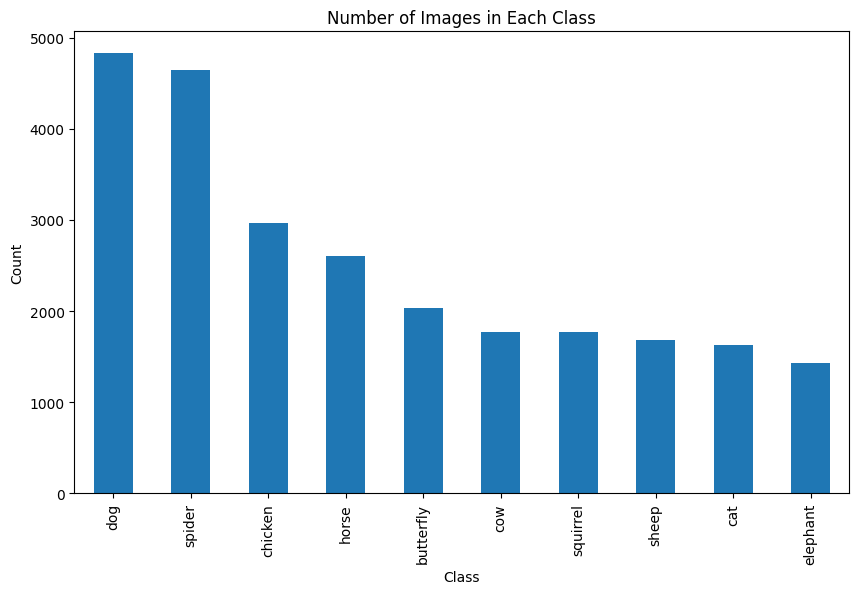

In [29]:
class_counts = df['Class'].value_counts()

plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar')
plt.title('Number of Images in Each Class')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

In [30]:
smallest_sample = np.min(class_counts)

np.random.seed(42)  # Make sure the samples are repeatable

sample_df = df.groupby('Class').apply(lambda x: x.sample(smallest_sample)).reset_index(drop=True)
sample_df.head()

,File_name,Class,Label,Path
0,OIP-f9P8cYWpnZLzBAG5c7F9WQHaFb.jpeg,butterfly,3.0,../archive/raw-img/farfalla/OIP-f9P8cYWpnZLzBA...
1,OIP-TIEldqJsQJCceWzMeWYBnwHaEo.jpeg,butterfly,3.0,../archive/raw-img/farfalla/OIP-TIEldqJsQJCceW...
2,OIP-lckTb9Q2k3_3nzkaTfeOGAHaHa.jpeg,butterfly,3.0,../archive/raw-img/farfalla/OIP-lckTb9Q2k3_3nz...
3,eb32b8072bfd003ed1584d05fb1d4e9fe777ead218ac10...,butterfly,3.0,../archive/raw-img/farfalla/eb32b8072bfd003ed1...
4,OIP-UwebrGDrUBSw37rTsKjZyAHaJ4.jpeg,butterfly,3.0,../archive/raw-img/farfalla/OIP-UwebrGDrUBSw37...


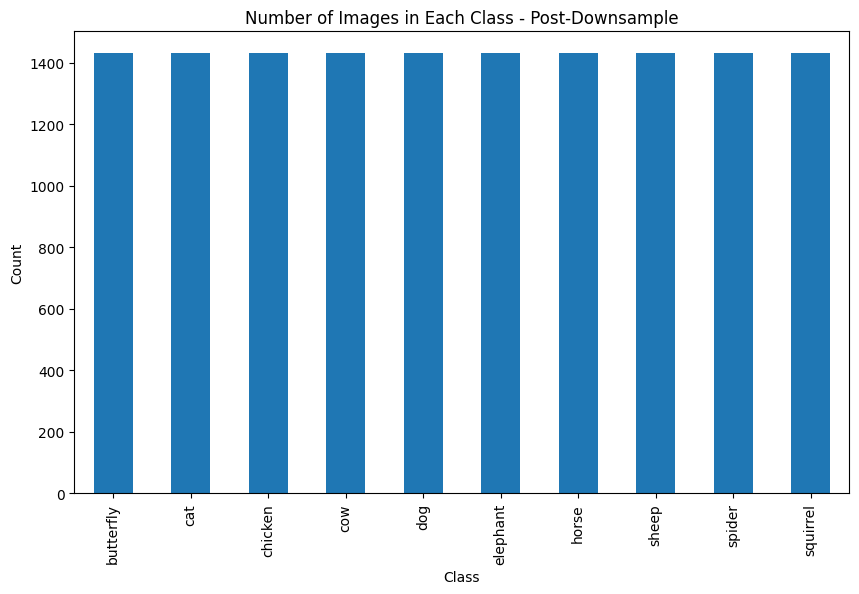

In [31]:
class_counts = sample_df['Class'].value_counts()

plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar')
plt.title('Number of Images in Each Class - Post-Downsample')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

### ```Transformations```

- Rescale and croppping at center

Displaying Random images after undergoing scaling

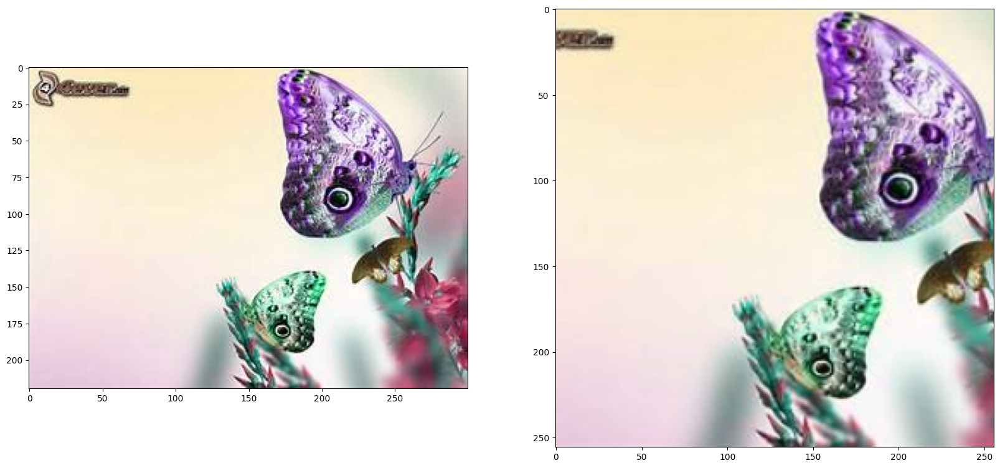

In [32]:
image = sample_df['Path'][0]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

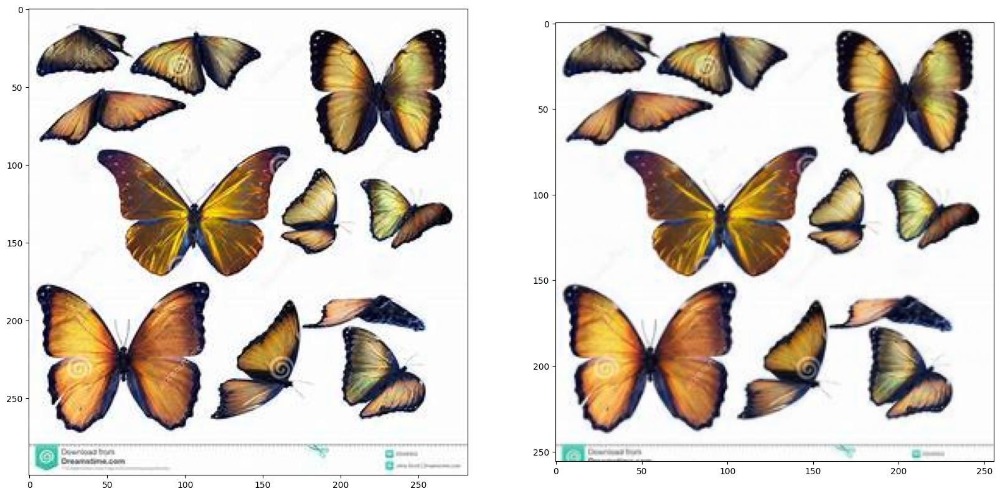

In [33]:
image = sample_df['Path'][786]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

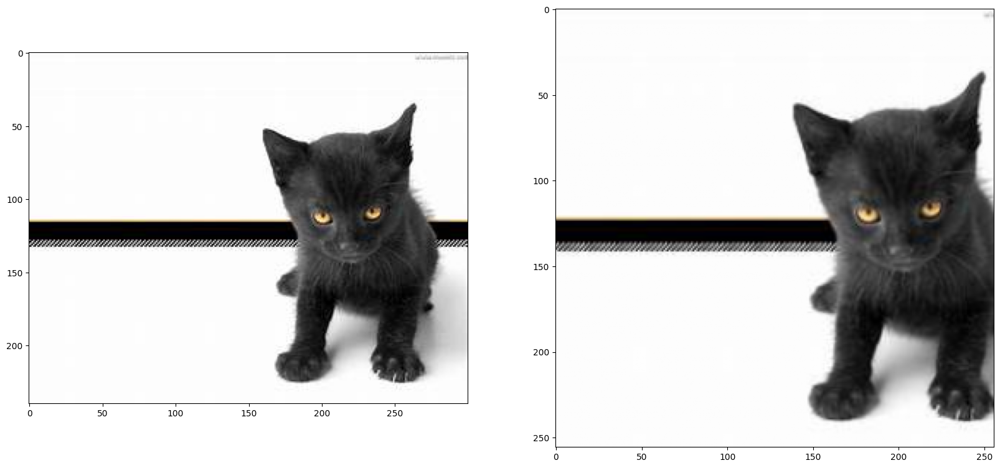

In [34]:
image = sample_df['Path'][1678]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

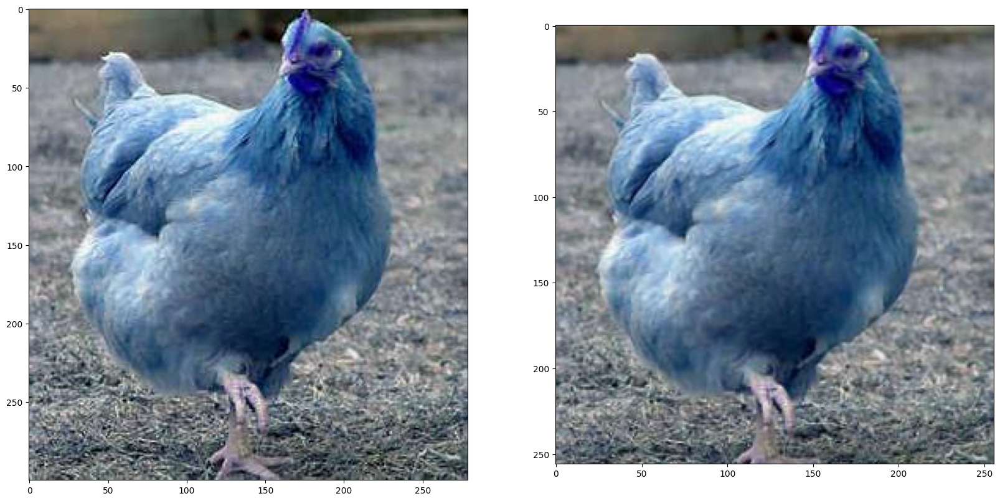

In [35]:
image = sample_df['Path'][3000]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

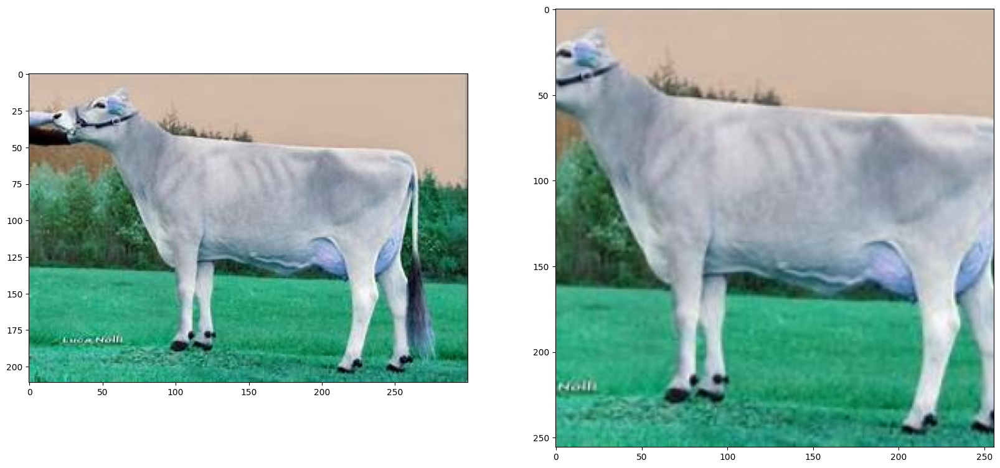

In [36]:
image = sample_df['Path'][4571]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

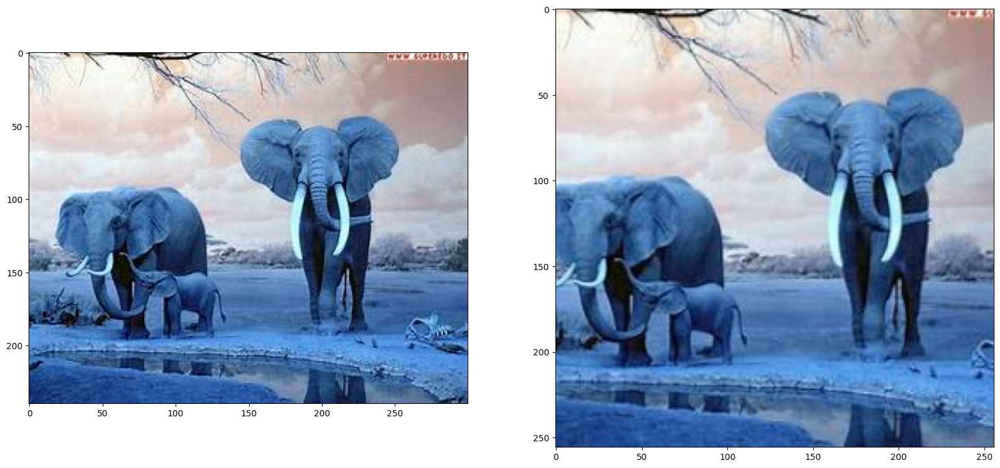

In [37]:
image = sample_df['Path'][7654]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

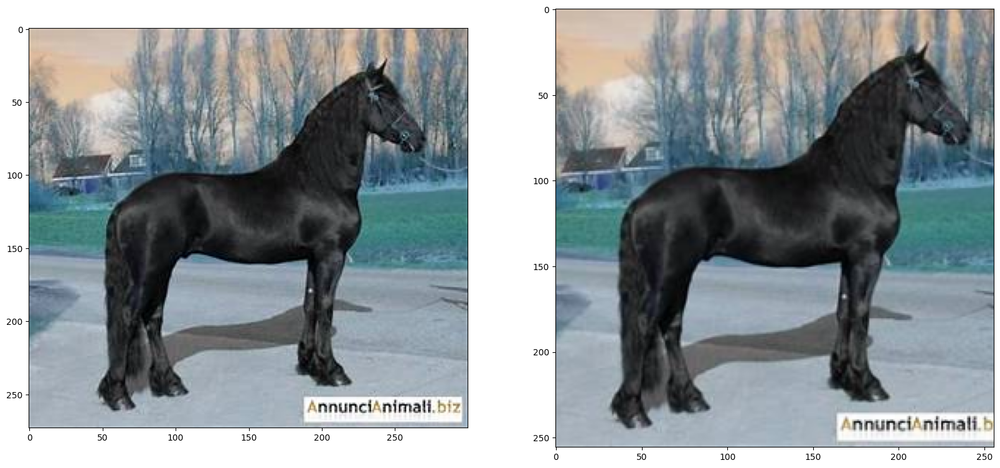

In [38]:
image = sample_df['Path'][9078]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

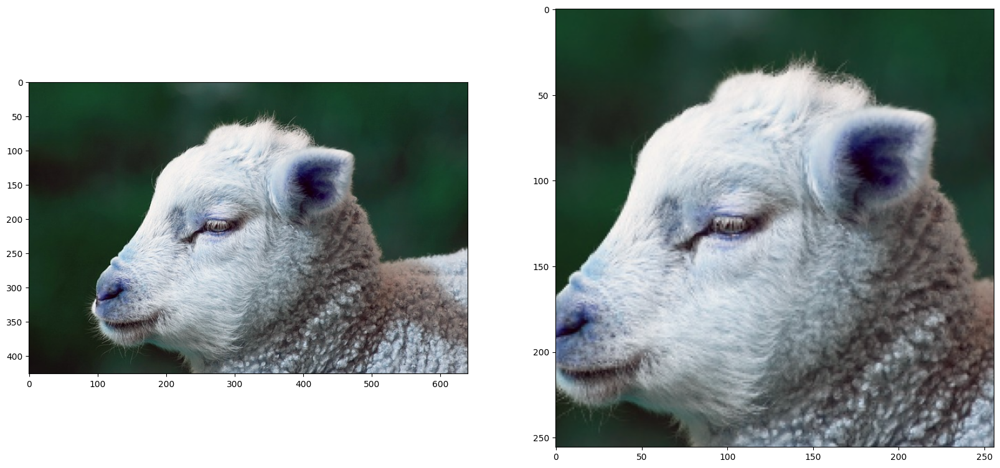

In [39]:
image = sample_df['Path'][10897]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()

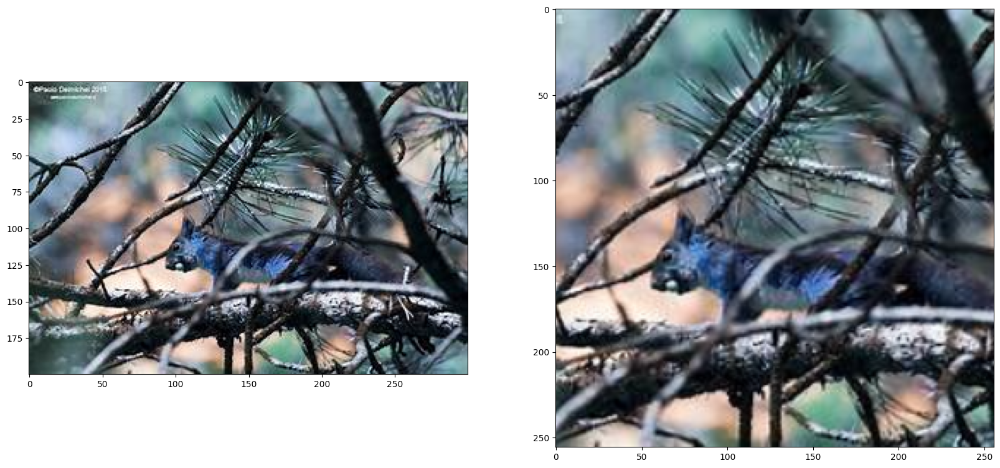

In [42]:
image = sample_df['Path'][13981]

img = cv2.imread(image)
fig, axs = plt.subplots(1, 2, figsize=(20,20))
axs[0].imshow(np.array(img))
axs[1].imshow(rescale_crop_image(np.array(img)))
plt.show()